# <span style='font-family:"Times New Roman"'> <span styel=''> **METRICS EXPLORATION**

## <span style='font-family:"Times New Roman"'> <span styel=''> *Emile Cohen* 
*March 2020*

**Goal:** In this notebook, we gather all the visualizations of the cohort based on the metrics for the 6 subgroups we defined in *group_exploration.ipynb*. We create different function to plot scatters, densities, barplots, pie plots to compare different metrics (Cancer Type, Variant Classification, Mutation/Gene Count, VAF1/VAF2, CCF1/CCF2, Purity, Vaf, Ccf, max_tp53_vaf, max_tp53,ccf, tp53_spots)

The Notebook is divided in 3 parts:
 
* **1. Count Plots**
* **2. Density Plots**
* **3. Scatter Plots**



**NB1:** In each part, you must run the cells from the begining in order to initialize the variables

**NB2:** All functions used for the plots are located in utils/custom_tools.py

---

In [99]:
%run -i '../../utils/setup_environment.ipy'
from utils.analysis_tools import *

import warnings, math

warnings.filterwarnings('ignore')
import ptitprince as pt
import IPython.display
from itertools import cycle, islice
from lifelines import KaplanMeierFitter

data_path = '../../data/'

Setup environment... done!


<span style="color:green">✅ Working on **mskimpact_env** conda environment.</span>

---
# 1. Count Plots

In this part, we define functions to visualize summaries for the following metrics:
* Cancer Type
* Variant Classification
* Mutation/Gene Count
* Tp53 Spots

In [100]:
master = pd.read_pickle(data_path + 'merged_data/master_file.pkl')
subgroups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH', '0_HETLOSS']
mut_subgroups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH']

master.head()

,Sample_Id,Tumor_Id,Patient_Id,Cancer_Type,Sample_Type,purity,ploidy,samples_per_patient,Overall Survival Status,Overall Survival (Months),MSI Score,TMB_Score,key_1,vc_1,ccf_1,vaf_1,HGVSp_1,spot_1,key_2,vc_2,ccf_2,vaf_2,HGVSp_2,spot_2,key_3,vc_3,ccf_3,vaf_3,HGVSp_3,spot_3,key_4,vc_4,ccf_4,vaf_4,HGVSp_4,spot_4,key_5,vc_5,ccf_5,vaf_5,HGVSp_5,spot_5,tp53_count,tcn,mcn,lcn,seg_length,cn_state,cf,wgd,mutation_count,gene_count,max_vaf,exp_nb_1,exp_nb_2,exp_nb_3,exp_nb_4,exp_nb_5,cn_group,mut_cn_group,chr_comput,chr_affected,chr_loss,chr_gain,chr_cnloh,frac_genome_altered,vc_group_1,vc_group_2,vc_group_3,vc_group_4,vc_group_5
0,P-0034223-T01-IM6_P-0034223-N01-IM6,P-0034223-T01-IM6,P-0034223,Breast Cancer,Metastasis,0.941111,2.241830,1.0,LIVING,NaN,0.55,5.3,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,1.0,1.0,80668592.0,DIPLOID,1.000000,-1.0,6,6.0,0.901899,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,"[3, 2, 2, 0, 0.08]",3,2,2,0,0.080,None,None,None,None,None
1,P-0009819-T01-IM5_P-0009819-N01-IM5,P-0009819-T01-IM5,P-0009819,Prostate Cancer,Primary,0.275237,2.681075,1.0,LIVING,23.441,0.00,1.0,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,1.0,1.0,0.0,80668309.0,HETLOSS,0.154578,-1.0,3,3.0,0.148014,NaN,NaN,NaN,NaN,NaN,LOSS,0_HETLOSS,"[4, 4, 0, 0, 0.137]",4,4,0,0,0.137,None,None,None,None,None
2,P-0025956-T01-IM6_P-0025956-N01-IM6,P-0025956-T01-IM6,P-0025956,Non-Small Cell Lung Cancer,Primary,0.185874,3.496971,1.0,DECEASED,3.584,0.00,5.3,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,6.0,0.200000,NaN,NaN,NaN,NaN,NaN,None,None,"[0, 0, 0, 0, nan]",0,0,0,0,NaN,None,None,None,None,None
3,P-0027408-T01-IM6_P-0027408-N01-IM6,P-0027408-T01-IM6,P-0027408,Non-Small Cell Lung Cancer,Metastasis,0.308886,1.811066,1.0,LIVING,22.586,0.27,17.6,P-0027408-T01-IM6_17_7578409_CT_TC,Missense_Mutation,0.925,0.168901,p.Arg174Glu,174,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,1,1.0,1.0,0.0,25260272.0,HETLOSS,0.315621,-1.0,21,19.0,0.192475,0.924711,NaN,NaN,NaN,NaN,LOSS,>=1_LOSS,"[12, 11, 3, 0, 0.452]",12,11,3,0,0.452,missense,None,None,None,None
4,P-0006554-T01-IM5_P-0006554-N01-IM5,P-0006554-T01-IM5,P-0006554,Glioma,Primary,0.715208,1.910719,1.0,LIVING,26.170,1.30,46.2,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,NaN,NaN,7465132.0,INDETERMINATE,NaN,NaN,47,39.0,0.706897,NaN,NaN,NaN,NaN,NaN,None,None,"[5, 4, 1, 0, 0.173]",5,4,1,0,0.173,None,None,None,None,None


In [101]:
sns.set_style("whitegrid", {'grid.color': '0.98'})
def annotate_axes(fig):
    for i, ax in enumerate(fig.axes):
        ax.tick_params(labelbottom=True, labelleft=True)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
def def_fig_set(figsize=(15,12), number = 6):
    fig=plt.figure(figsize=figsize)
    if number == 6:
        ax1 = plt.subplot2grid(shape=(3,7), loc=(0,0), colspan=3)
        ax2 = plt.subplot2grid((3,7), (0,4), colspan=3)
        ax3 = plt.subplot2grid((3,7), (1,0), colspan=3)
        ax4 = plt.subplot2grid((3,7), (1,4), colspan=3)
        ax5 = plt.subplot2grid((3,7), (2,0), colspan=3)
        ax6 = plt.subplot2grid((3,7), (2,4), colspan=3)
    
    if number == 5:
        ax1 = plt.subplot2grid(shape=(3,7), loc=(0,0), colspan=3)
        ax2 = plt.subplot2grid((3,7), (0,4), colspan=3)
        ax3 = plt.subplot2grid((3,7), (1,0), colspan=3)
        ax4 = plt.subplot2grid((3,7), (1,4), colspan=3)
        ax5 = plt.subplot2grid((3,7), (2,2), colspan=3)
    
    if number == 4:
        ax1 = plt.subplot2grid(shape=(3,7), loc=(0,0), colspan=3)
        ax2 = plt.subplot2grid((3,7), (0,4), colspan=3)
        ax3 = plt.subplot2grid((3,7), (1,0), colspan=3)
        ax4 = plt.subplot2grid((3,7), (1,4), colspan=3)
    
    annotate_axes(fig)
    
    return fig

def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])


my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, 6))
my_colors_set = []
# We define 10 colors from each colors
for color in my_colors:
    to_append = []
    for i in range(1,11):
        to_append.append(lighten_color(color, amount=0.1*i))
    my_colors_set.append(to_append)
#my_colors_set

### Cancer Type

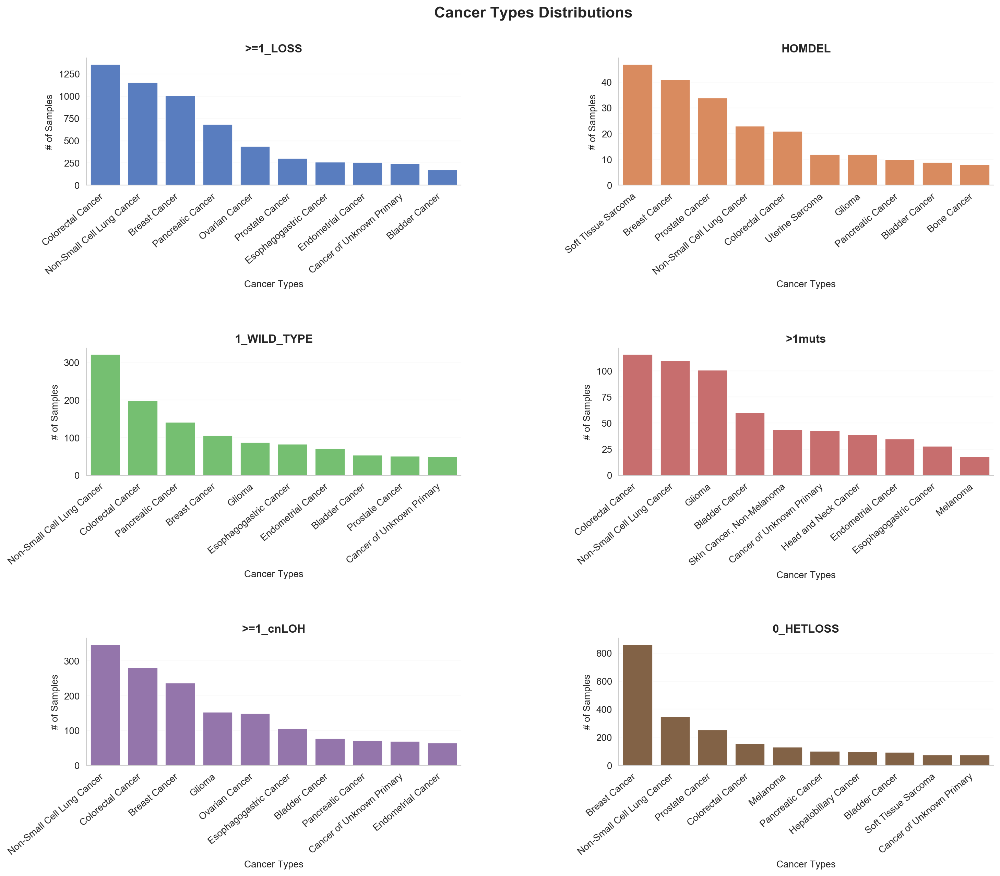

In [102]:
fig = def_fig_set()
fig.suptitle('Cancer Types Distributions', fontsize=16, weight='bold', y=1)
my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, 6))
fig.tight_layout(pad=5, w_pad=0.5, h_pad=15)

for ax, subgroup,i in zip(fig.axes, subgroups, range(len(subgroups))):
    data = master[master['mut_cn_group'] == subgroup]
    data_cancer = pd.DataFrame(get_groupby(data, 'Cancer_Type', 'count')).sort_values(by=['count'], ascending=False).head(10)
    sns.barplot(y='count', x=data_cancer.index, data=data_cancer, ax=ax, color=my_colors[i])
    ax.set_xlabel('Cancer Types')
    ax.set_ylabel('# of Samples')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    ax.set_title(subgroup, weight = 'bold')

### Variant Classification

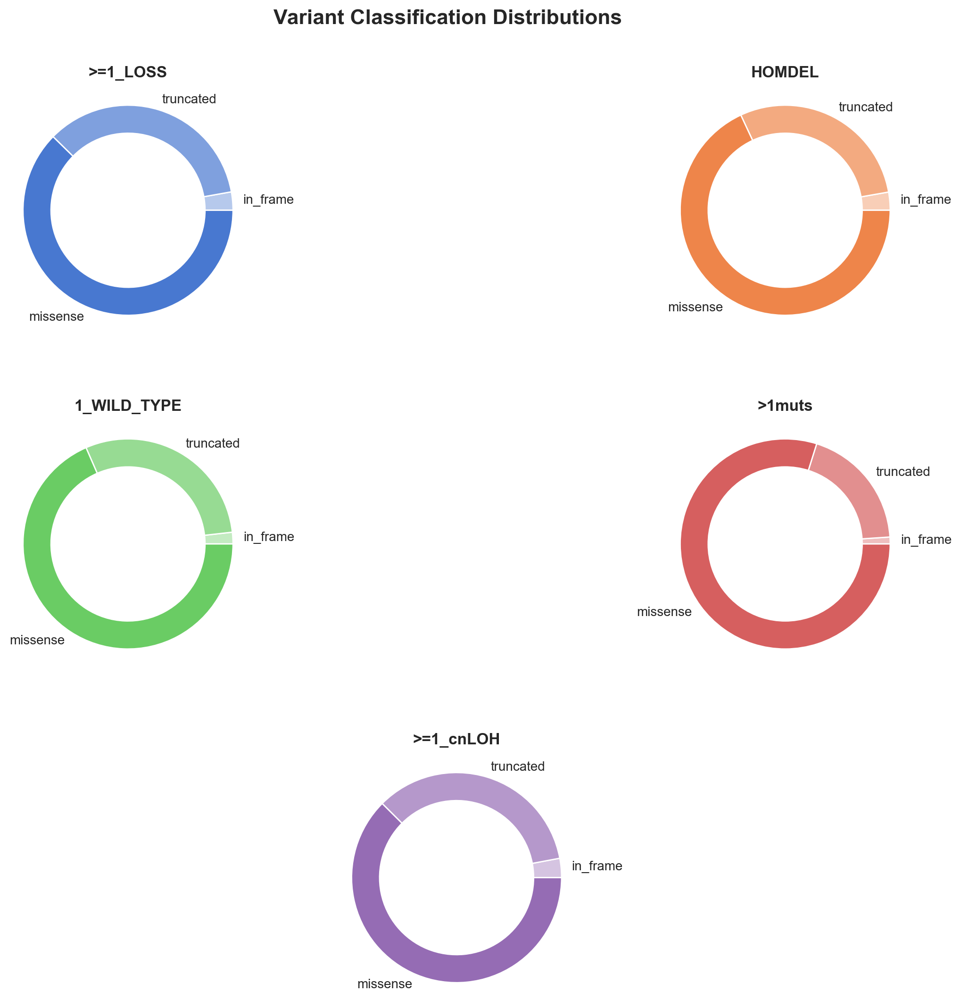

In [19]:
fig = def_fig_set(number = 5)
fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
fig.suptitle('Variant Classification Distributions', fontsize=16, weight='bold')

for ax, subgroup,i in zip(fig.axes, mut_subgroups, range(len(subgroups))):
    data = master[master['mut_cn_group'] == subgroup]
    data_1 = get_groupby(data,'vc_group_1', 'count'); data_2 = get_groupby(data,'vc_group_2', 'count'); data_3 = get_groupby(data,'vc_group_3', 'count') ; data_4 = get_groupby(data,'vc_group_4', 'count') ; data_5 = get_groupby(data,'vc_group_5', 'count') 
    count = (data_1+data_2+data_3+data_4+data_5).fillna(data_1).fillna(data_2).fillna(data_3).fillna(data_4).fillna(data_5).sort_values(by=['count'])
    
    mypie, _ = ax.pie(list(count['count']), radius=1.5,labels=list(count.index), labeldistance=1.1,rotatelabels=False, colors=[my_colors_set[i][3],my_colors_set[i][6],my_colors_set[i][9]])
    plt.setp(mypie, width=0.4, edgecolor='white')
    ax.set_title(subgroup, weight = 'bold', pad=35)

### Mutation/Gene Count

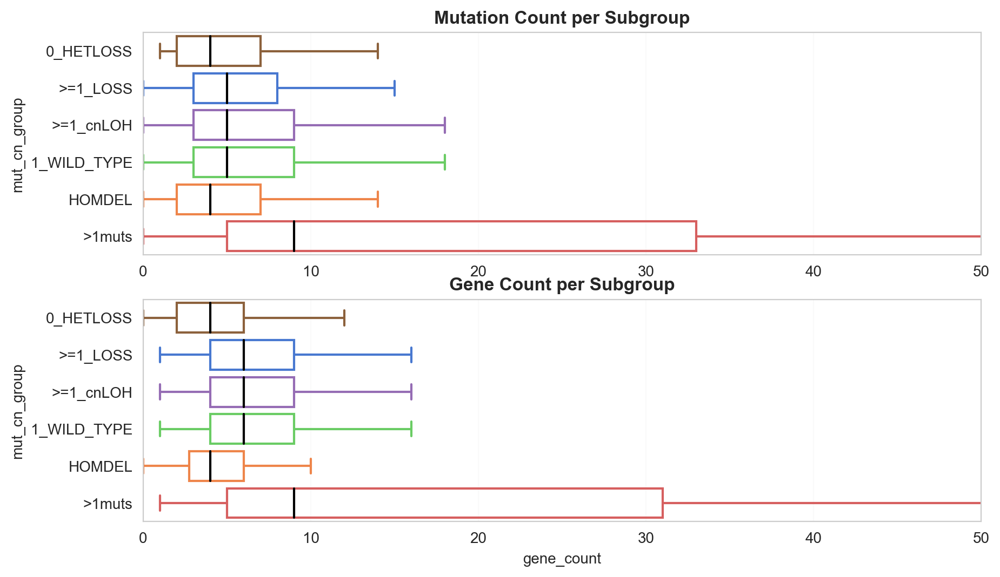

In [34]:
fig=plt.figure(figsize=(10,6))
#fig.suptitle('Mutation/Gene Count per Subgroup', fontsize=16, weight='bold')
ax1 = plt.subplot2grid(shape=(2,1), loc=(0,0), colspan=1)
ax2 = plt.subplot2grid(shape=(2,1), loc=(1,0), colspan=1)
ax1.set_xlim(0, 50)
ax2.set_xlim(0, 50)

data = master[['tp53_count', 'mut_cn_group', 'mutation_count','gene_count', 'Sample_Type']]
data['mutation_count_adjusted'] = data['mutation_count'] - data['tp53_count']

# If we want to filter on The Sample Type
#data = data[data['Sample_Type'] == 'Metastasis']

sns.boxplot(y="mut_cn_group", x="mutation_count_adjusted",data=data,ax=ax1, dodge=False, palette=my_colors).set_title('Mutation Count per Subgroup', weight='bold', fontsize=12)
'''sns.swarmplot(y="mut_cn_group", x="mutation_count_adjusted",
              data=data, 
              ax=ax1,
              color='grey',
              alpha=0.75)'''
sns.boxplot(y="mut_cn_group", x="gene_count",data=data,ax=ax2, dodge=False, palette=my_colors).set_title('Gene Count per Subgroup', weight='bold',fontsize=12)
#dx="mutation_count_adjusted"; dy="mut_cn_group"; ort="h"; pal = my_colors; sigma = .2; dhue = "mut_cn_group"; dhue_order=subgroups
#pt.RainCloud(x = dx, y = dy, data = data, palette = pal, bw = sigma, hue=dhue, hue_order=dhue_order,
#width_viol = .6, ax = ax, orient = ort)
ax1.set_xlabel('')
my_colors_remixed = [my_colors[5], my_colors[0], my_colors[4], my_colors[2], my_colors[1], my_colors[3]]
for ax in fig.axes:
    for box,i in zip(ax.artists,range(6)):
        box.set_facecolor(my_colors_remixed[i])

for ax in [ax1, ax2]:
    for i,artist in enumerate(ax.artists):
        # Set the linecolor on the artist to the facecolor, and set the facecolor to None
        col = artist.get_facecolor()
        artist.set_edgecolor(col)
        artist.set_facecolor('None')

        # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same colour as above
        for j in range(i*6,i*6+6):
            line = ax.lines[j]
            if j%6 == 4 : line.set_color('black')
            else: line.set_color(col)
            line.set_mfc('None')
            line.set_mec('None')

### TP53 Spots

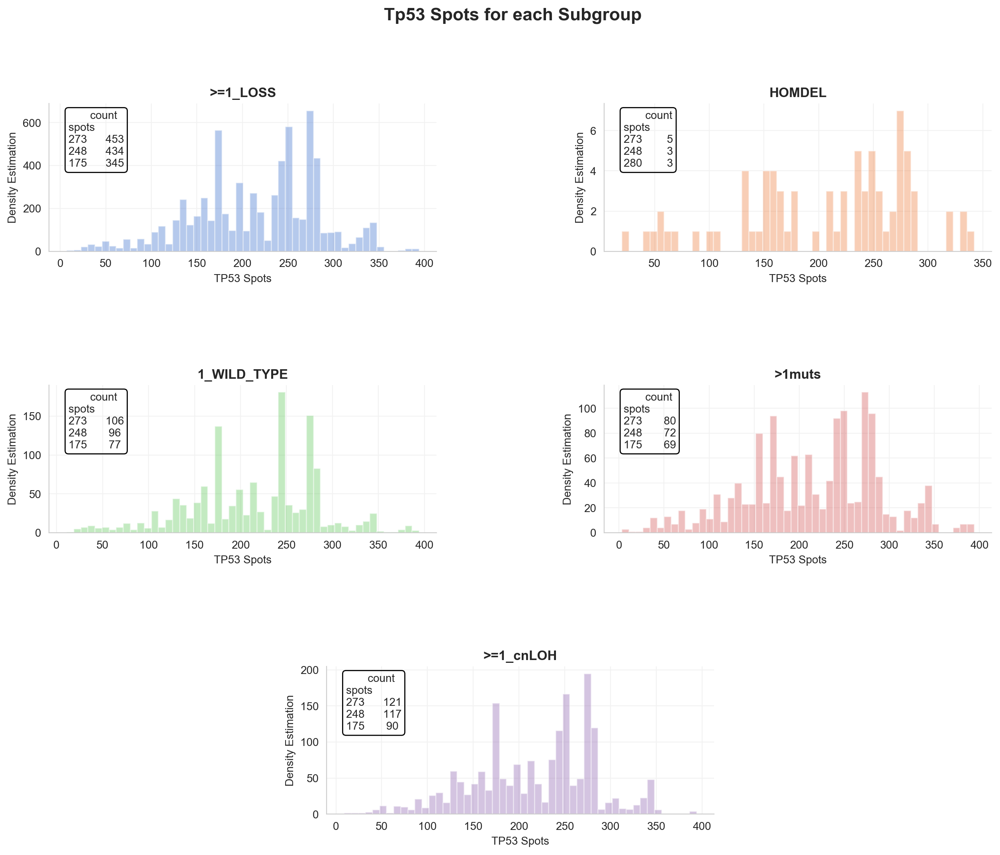

In [10]:
fig = def_fig_set(number = 5)
fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
fig.suptitle('Tp53 Spots for each Subgroup', fontsize=16, weight='bold')

for ax, subgroup,i in zip(fig.axes, mut_subgroups, range(len(subgroups))):
    data = master[master['mut_cn_group'] == subgroup]
    
    data_spots = list(data['spot_1']) + list(data['spot_2']) + list(data['spot_3']) + list(data['spot_4']) + list(data['spot_5'])
    data_spot_df = pd.DataFrame(data_spots, columns=['spots']).dropna()
    count = pd.DataFrame(data_spot_df.groupby(['spots']).size(), columns=['count']).sort_values(by=['count'], ascending=False)
    count = pd.DataFrame(count, index = count.index.drop('nan')).head(3)
    
    sns.distplot(data_spots, bins=50, kde=False, color=my_colors[i], ax=ax)
    ax.set_xlabel('TP53 Spots')
    ax.set_ylabel('Density Estimation')
    ax.set_title(subgroup, weight = 'bold')
    ax.text(.05, .95, str(count), transform=ax.transAxes, ha="left", va="top", bbox=dict(facecolor='none', edgecolor='black', boxstyle='round'))

---
# 2. Density Plots

In [47]:
def get_densities(master:pd.DataFrame, metrics:str, fig_title:str, xlabel, ylabel,  number=6, met_prim:str = None, clip = (0.0,3.0), x_lim =[0,1]):
    # We initialize the figure
    fig = def_fig_set(number = number)
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(fig_title, fontsize=16, weight='bold')
    
    # We differentiate the groups if we have 
    if number==6: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH', '0_HETLOSS']
    if number==5: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH']
        
    for ax, group,i in zip(fig.axes, groups, range(len(groups))):
        data = master[master['mut_cn_group'] == group]
        if met_prim:
            data = data[data['Sample_Type'] == met_prim]
        sns.distplot(data[metrics], hist=False,kde_kws={'clip': clip, "shade": True}, ax=ax, color=my_colors[i])
        ax.set_xlim(x_lim)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        
        # Adding MEan and Median Information
        mean=round(data[metrics].mean(),2) ; median=round(data[metrics].median(),2)
        string = 'Mean: '+ str(mean) +'\nMedian: ' + str(median)
        ax.axvline(mean, color='g', linestyle='-', label='Mean: '+ str(mean))
        ax.axvline(median, color='b', linestyle='-', label='Median: ' + str(median))
        ax.legend()
        
        ax.set_title(group, weight = 'bold')

### Purity

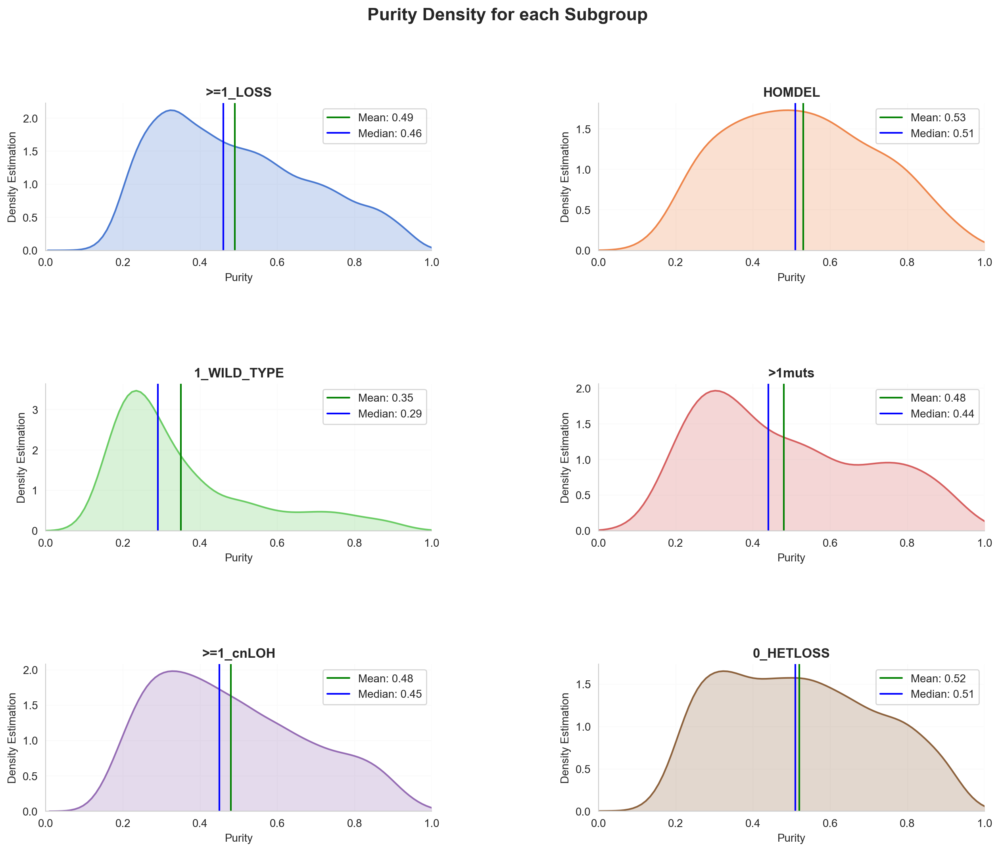

In [48]:
# Purity Comparison for all samples
get_densities(master, 'purity', fig_title='Purity Density for each Subgroup', xlabel='Purity', ylabel='Density Estimation',  number=6)

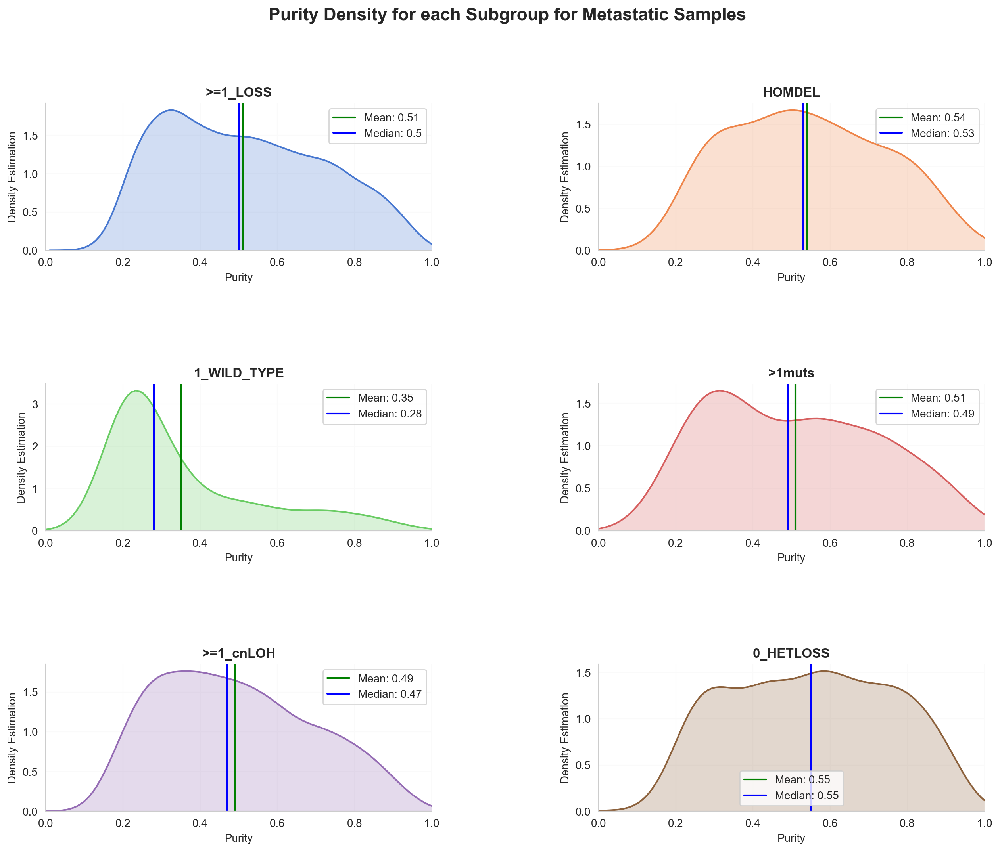

In [43]:
# Purity Comparison for Metastatic Samples
get_densities(master, 'purity', fig_title='Purity Density for each Subgroup for Metastatic Samples', xlabel='Purity', ylabel='Density Estimation',  number=6, met_prim='Metastasis')

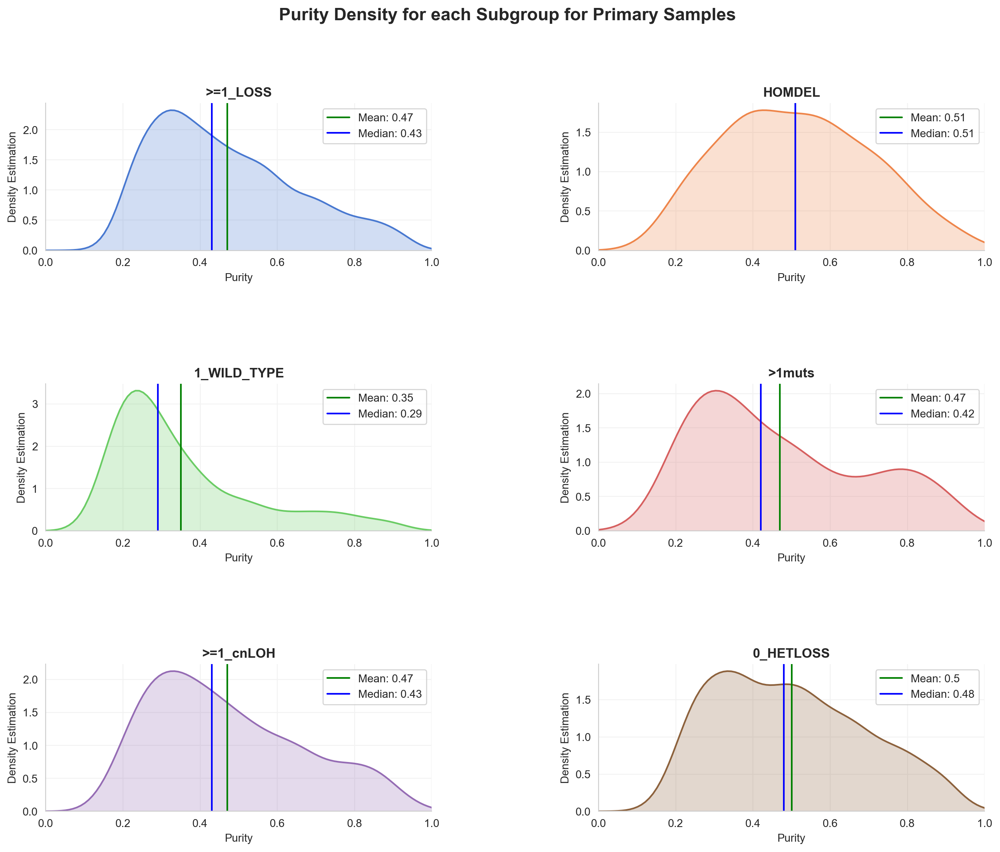

In [93]:
# Purity Comparison for Primary Samples
get_densities(master, 'purity', fig_title='Purity Density for each Subgroup for Primary Samples', xlabel='Purity', ylabel='Density Estimation',  number=6, met_prim='Primary')

### Cancer Cell Fraction

In [102]:
# We need to prepare the data as in the master we have 5 ccf columns 
data_1 = master[['Sample_Type','mut_cn_group', 'ccf_1']] ; data_2 = master[['Sample_Type','mut_cn_group', 'ccf_2']] ; data_3 = master[['Sample_Type','mut_cn_group', 'ccf_3']] ; data_4 = master[['Sample_Type','mut_cn_group', 'ccf_4']] ; data_5 = master[['Sample_Type','mut_cn_group', 'ccf_5']]
data_1 = data_1.rename(columns={'ccf_1': 'ccf'}) ; data_2 = data_2.rename(columns={'ccf_2': 'ccf'}) ; data_3 = data_3.rename(columns={'ccf_3': 'ccf'}) ; data_4 = data_4.rename(columns={'ccf_4': 'ccf'}) ; data_5 = data_5.rename(columns={'ccf_5': 'ccf'}) ;
data_ccf = data_1.append([data_2, data_3, data_4, data_5]).dropna(subset=['ccf'])

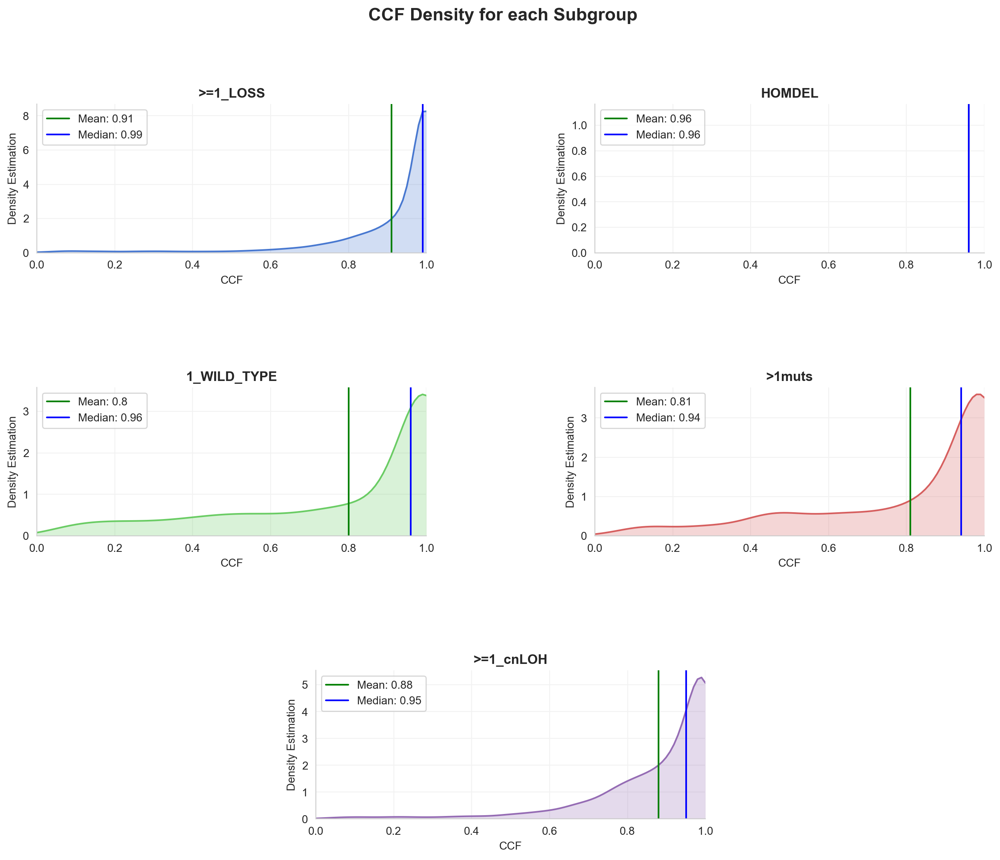

In [103]:
# CCF Density Comparison for all samples
get_densities(data_ccf, 'ccf', fig_title='CCF Density for each Subgroup', xlabel='CCF', ylabel='Density Estimation',  number=5)

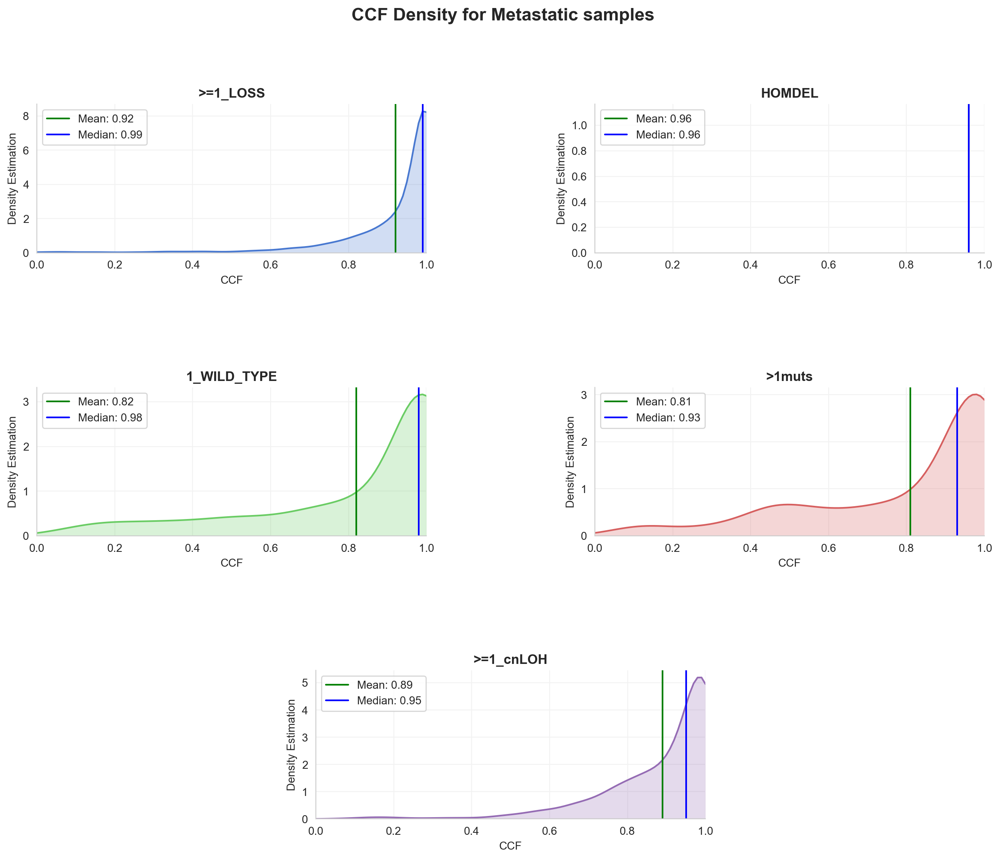

In [104]:
# CCF Density Comparison for Metastatic samples
get_densities(data_ccf, 'ccf', fig_title='CCF Density for Metastatic samples', xlabel='CCF', ylabel='Density Estimation',  number=5, met_prim='Metastasis')

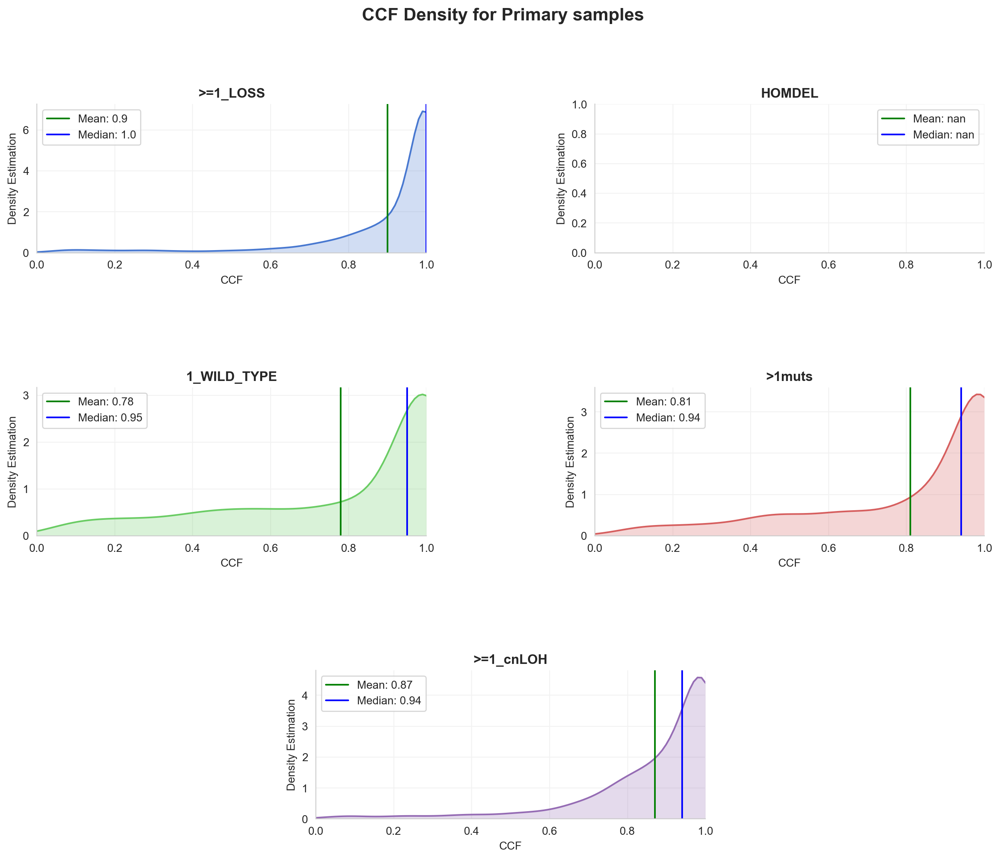

In [105]:
# CCF Density Comparison for Primary samples
get_densities(data_ccf, 'ccf', fig_title='CCF Density for Primary samples', xlabel='CCF', ylabel='Density Estimation',  number=5, met_prim='Primary')

### TP53 Variant Allele Frequency

In [101]:
# We need to prepare the data as in the master we have 5 vaff columns 
data_1 = master[['Sample_Type','mut_cn_group', 'vaf_1']] ; data_2 = master[['Sample_Type','mut_cn_group', 'vaf_2']] ; data_3 = master[['Sample_Type','mut_cn_group', 'vaf_3']] ; data_4 = master[['Sample_Type','mut_cn_group', 'vaf_4']] ; data_5 = master[['Sample_Type','mut_cn_group', 'vaf_5']]
data_1 = data_1.rename(columns={'vaf_1': 'vaf'}) ; data_2 = data_2.rename(columns={'vaf_2': 'vaf'}) ; data_3 = data_3.rename(columns={'vaf_3': 'vaf'}) ; data_4 = data_4.rename(columns={'vaf_4': 'vaf'}) ; data_5 = data_5.rename(columns={'vaf_5': 'vaf'}) ;
data_vaf = data_1.append([data_2, data_3, data_4, data_5]).dropna(subset=['vaf'])

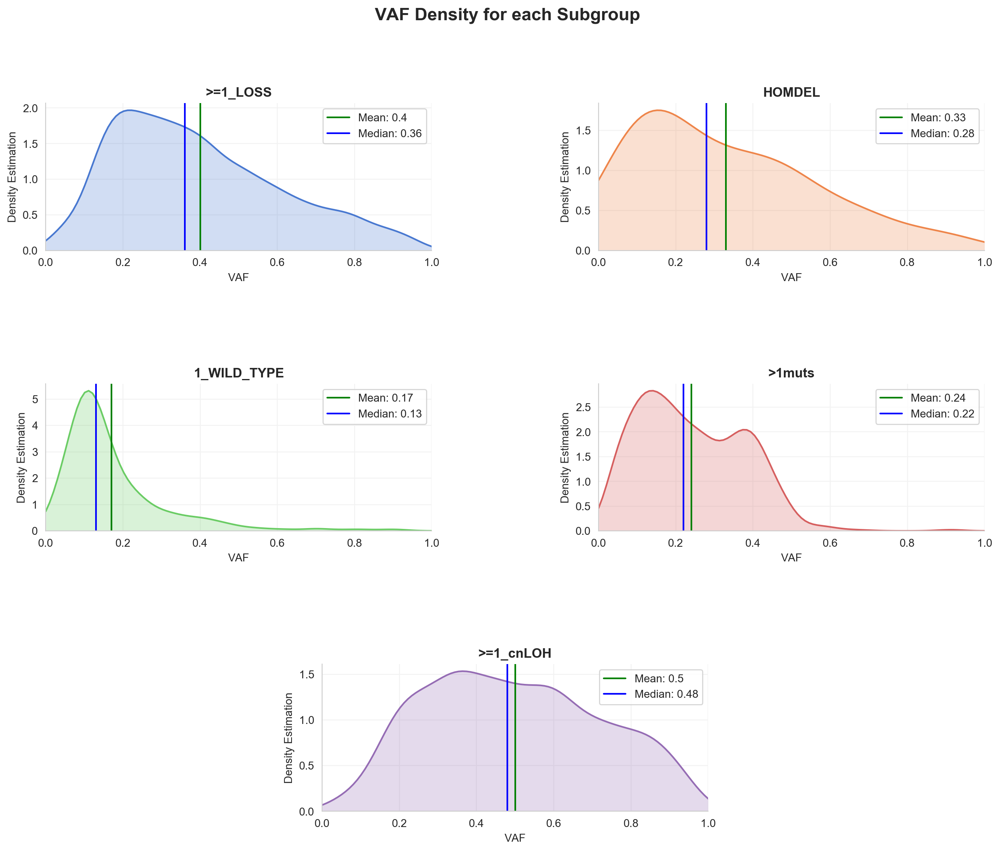

In [109]:
# VAF Density Comparison for all samples
get_densities(data_vaf, 'vaf', fig_title='VAF Density for each Subgroup', xlabel='VAF', ylabel='Density Estimation',  number=5)

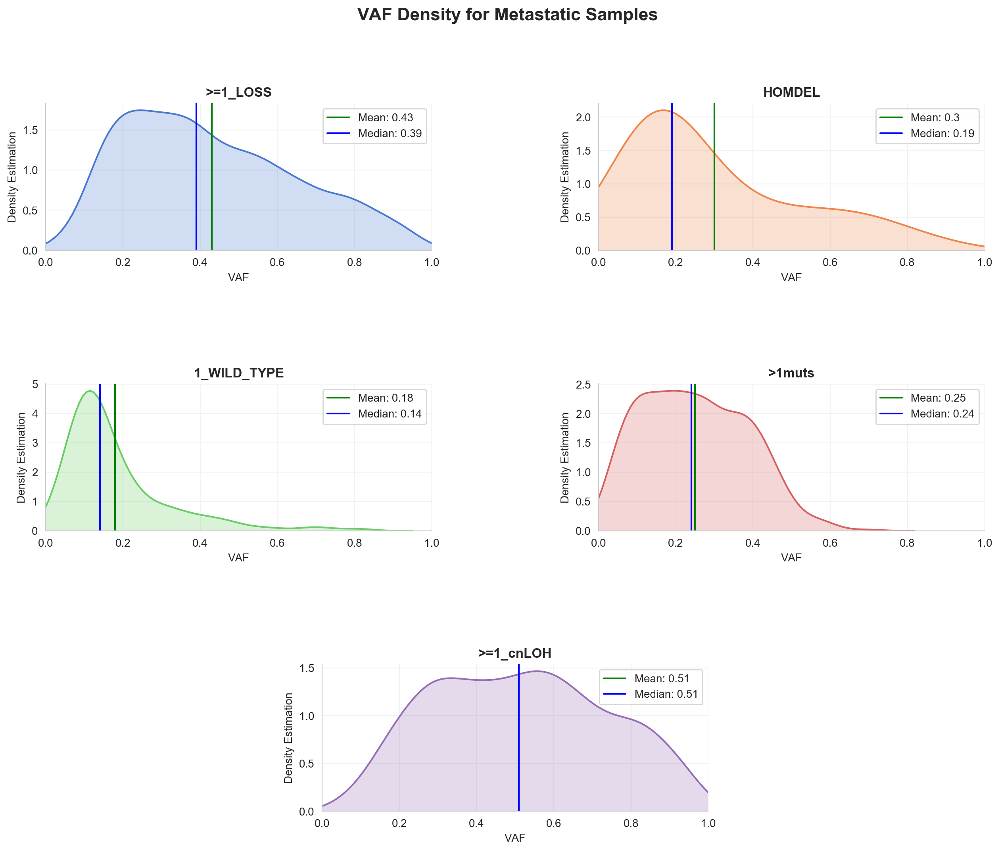

In [110]:
# VAF Density Comparison for Metastatic samples
get_densities(data_vaf, 'vaf', fig_title='VAF Density for Metastatic Samples', xlabel='VAF', ylabel='Density Estimation',  number=5, met_prim='Metastasis')

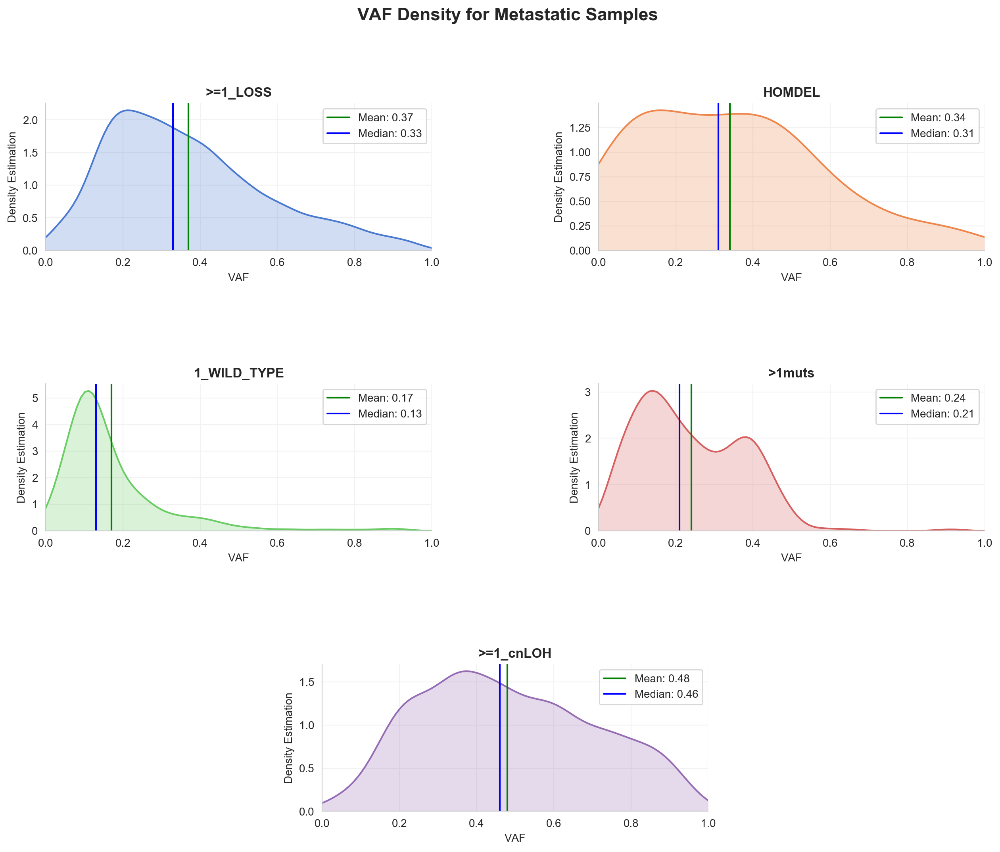

In [111]:
# VAF Density Comparison for Primary samples
get_densities(data_vaf, 'vaf', fig_title='VAF Density for Primary Samples', xlabel='VAF', ylabel='Density Estimation',  number=5, met_prim='Primary')

### Max TP53 CCF

In [153]:
# We need to preprocess the data to have a single column with the max_tp53_ccf per sample
data_vaf = master[['Sample_Type','mut_cn_group', 'ccf_1', 'ccf_2', 'ccf_3','ccf_4','ccf_5']]
max_table_ccf = pd.DataFrame(np.sort(data_vaf[['ccf_1', 'ccf_2', 'ccf_3','ccf_4','ccf_5']].fillna(0).values)[:,-1:], columns=['largest'])

max_table_ccf = pd.concat([data_vaf.reset_index(), max_table_ccf], axis=1)

# We remove samples with largest == 0
max_table_ccf = max_table_ccf[max_table_ccf['largest'] != 0]
max_table_ccf = max_table_ccf.dropna(subset=['largest'])

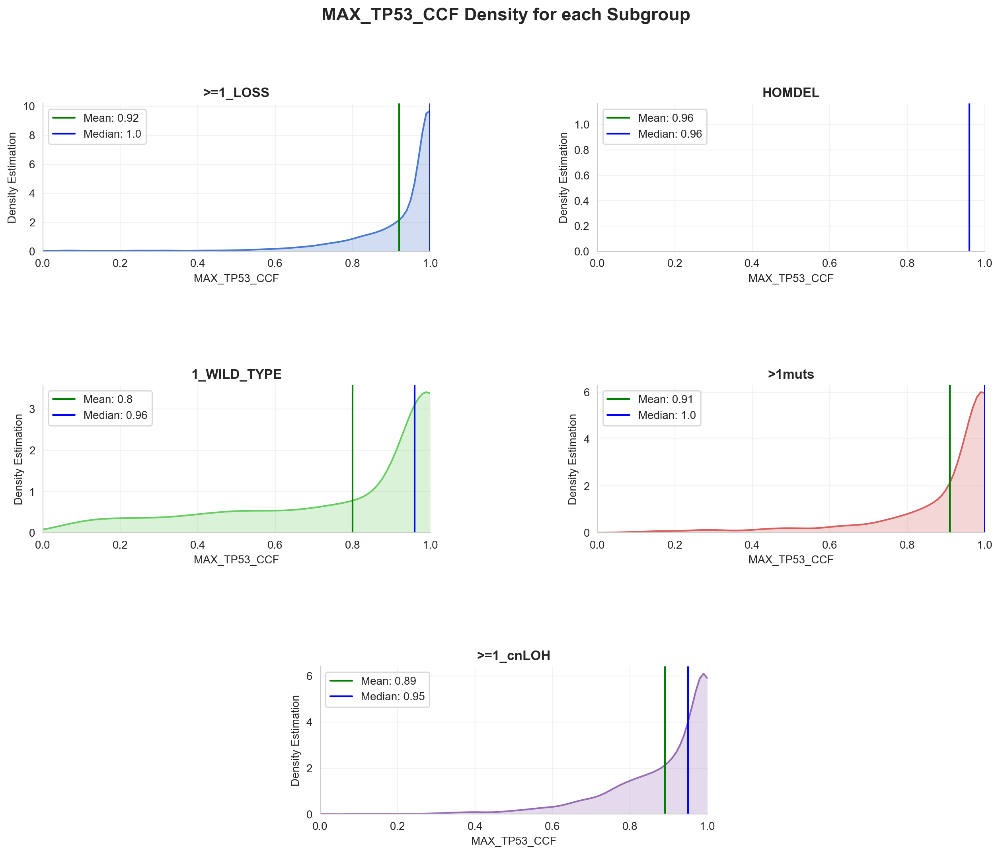

In [154]:
# MAX_CCF Density Comparison for all samples
get_densities(max_table_ccf, 'largest', fig_title='MAX_TP53_CCF Density for each Subgroup', xlabel='MAX_TP53_CCF', ylabel='Density Estimation',  number=5)

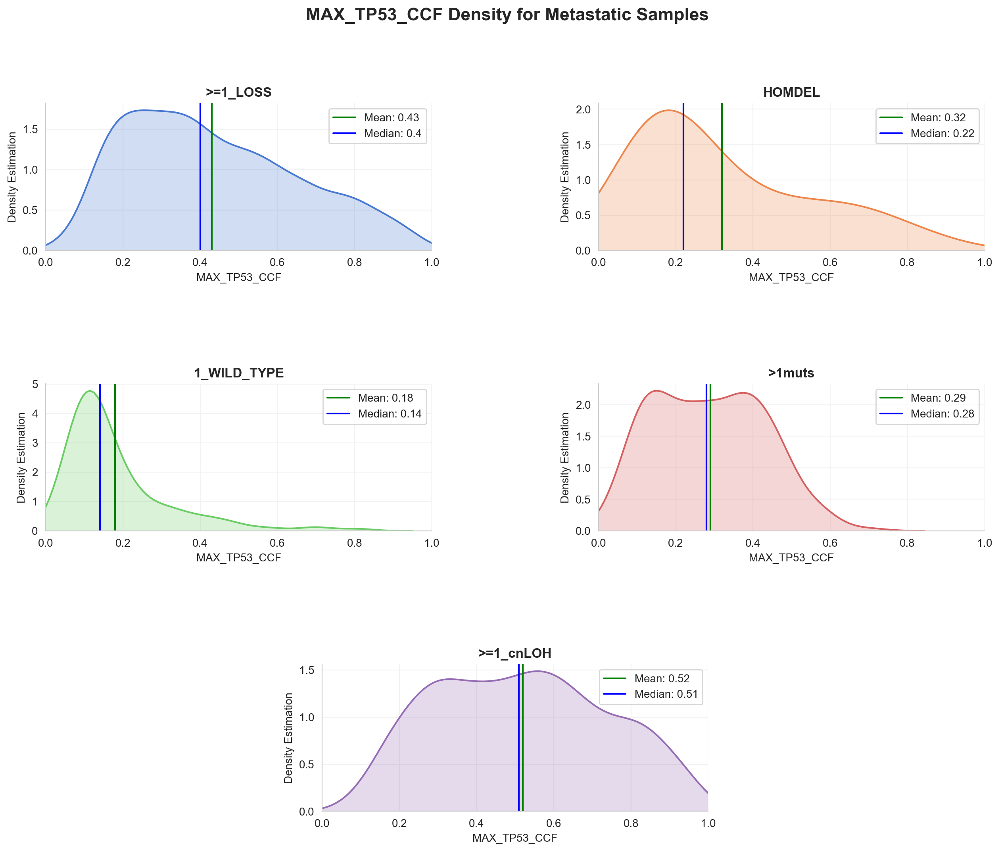

In [155]:
# MAX_CCF Density Comparison for Metastatic samples
get_densities(max_table_, 'largest', fig_title='MAX_TP53_CCF Density for Metastatic Samples', xlabel='MAX_TP53_CCF', ylabel='Density Estimation',  number=5, met_prim='Metastasis')

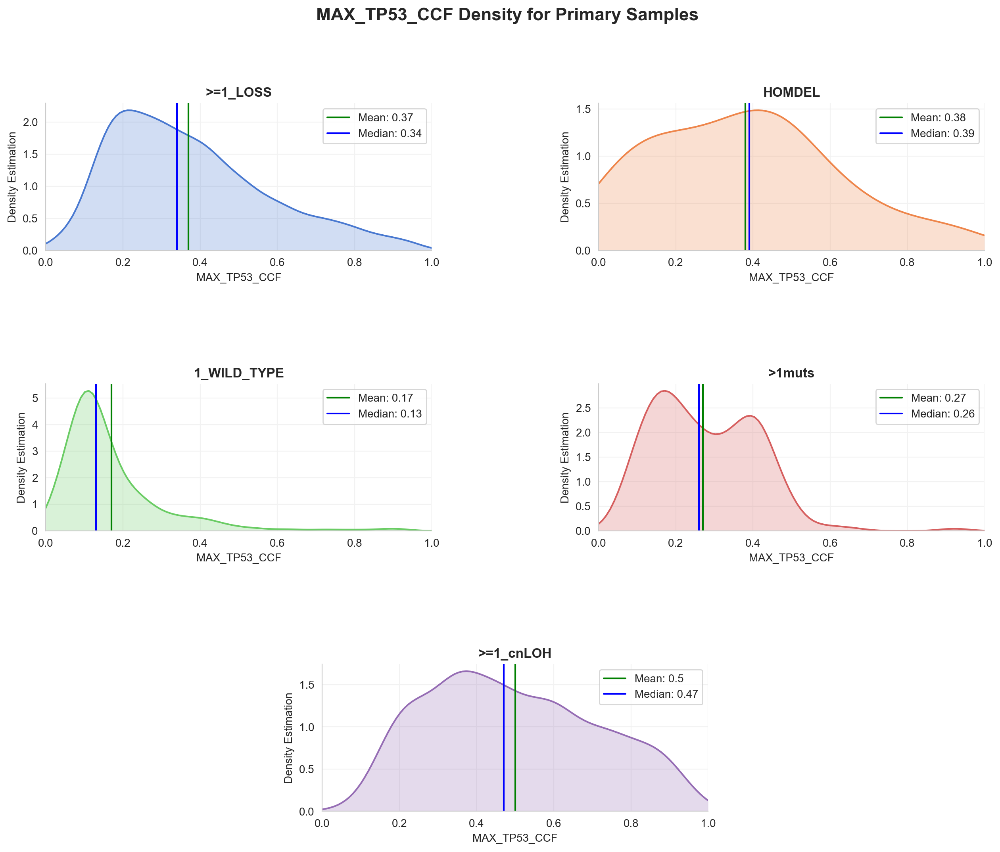

In [156]:
# MAX_CCF Density Comparison for Primary samples
get_densities(max_table_vaf, 'largest', fig_title='MAX_TP53_CCF Density for Primary Samples', xlabel='MAX_TP53_CCF', ylabel='Density Estimation',  number=5, met_prim='Primary')

### Max TP53 VAF

In [147]:
# We need to preprocess the data to have a single column with the max_tp53_vaf per sample
data_vaf = master[['Sample_Type','mut_cn_group', 'vaf_1', 'vaf_2', 'vaf_3','vaf_4','vaf_5']]
max_table_vaf = pd.DataFrame(np.sort(data_vaf[['vaf_1', 'vaf_2', 'vaf_3','vaf_4','vaf_5']].fillna(0).values)[:,-1:], columns=['largest'])

max_table_vaf = pd.concat([data_vaf.reset_index(), max_table_vaf], axis=1)

# We remove samples with largest == 0
max_table_vaf = max_table_vaf[max_table_vaf['largest'] != 0]
max_table_vaf = max_table_vaf.dropna(subset=['largest'])

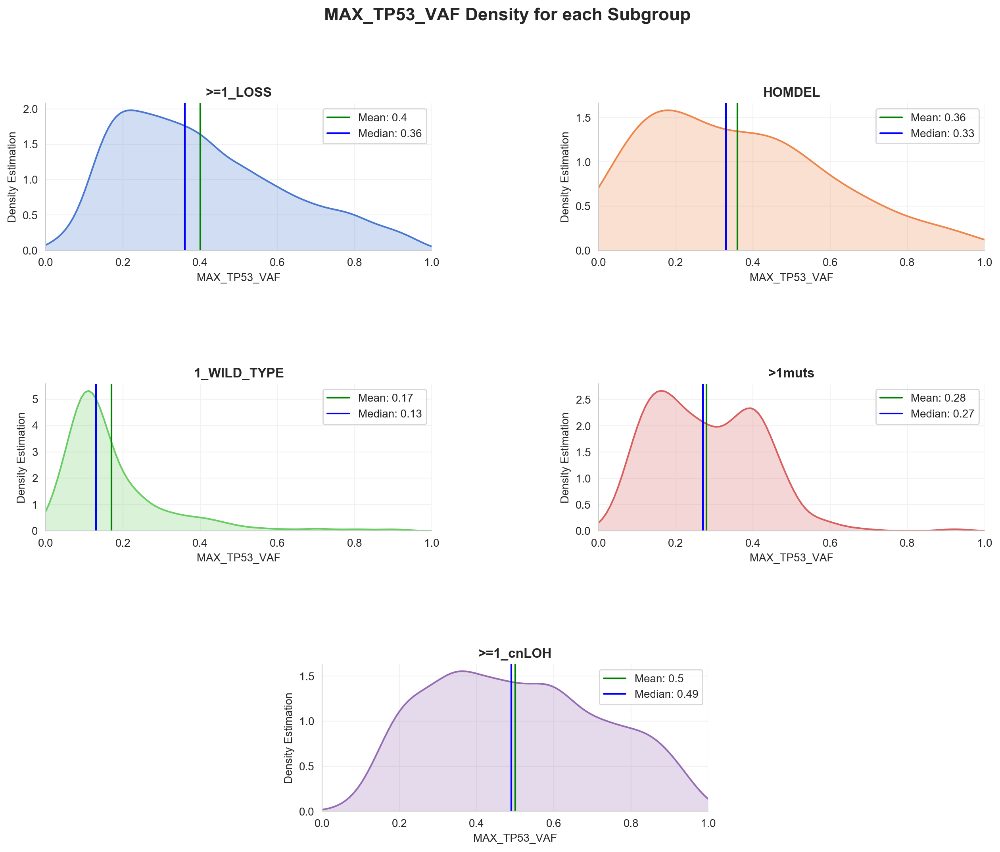

In [148]:
# MAX_VAF Density Comparison for all samples
get_densities(max_table_vaf, 'largest', fig_title='MAX_TP53_VAF Density for each Subgroup', xlabel='MAX_TP53_VAF', ylabel='Density Estimation',  number=5)

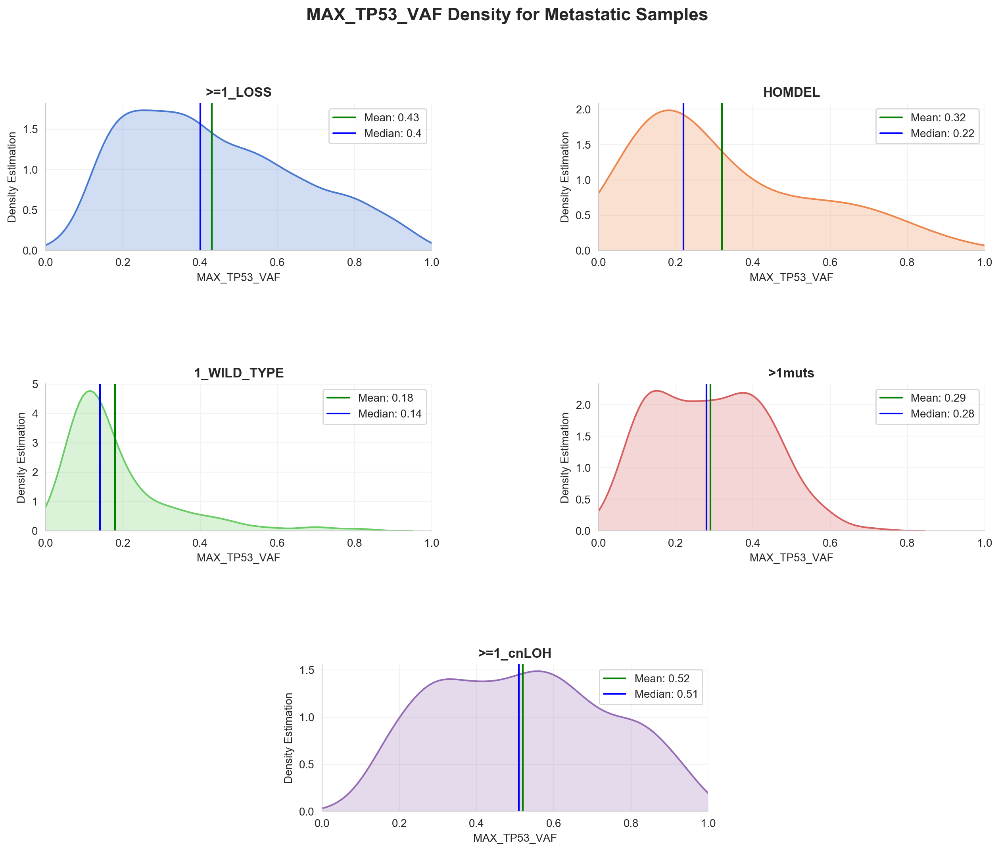

In [149]:
# MAX_VAF Density Comparison for Metastatic samples
get_densities(max_table_vaf, 'largest', fig_title='MAX_TP53_VAF Density for Metastatic Samples', xlabel='MAX_TP53_VAF', ylabel='Density Estimation',  number=5, met_prim='Metastasis')

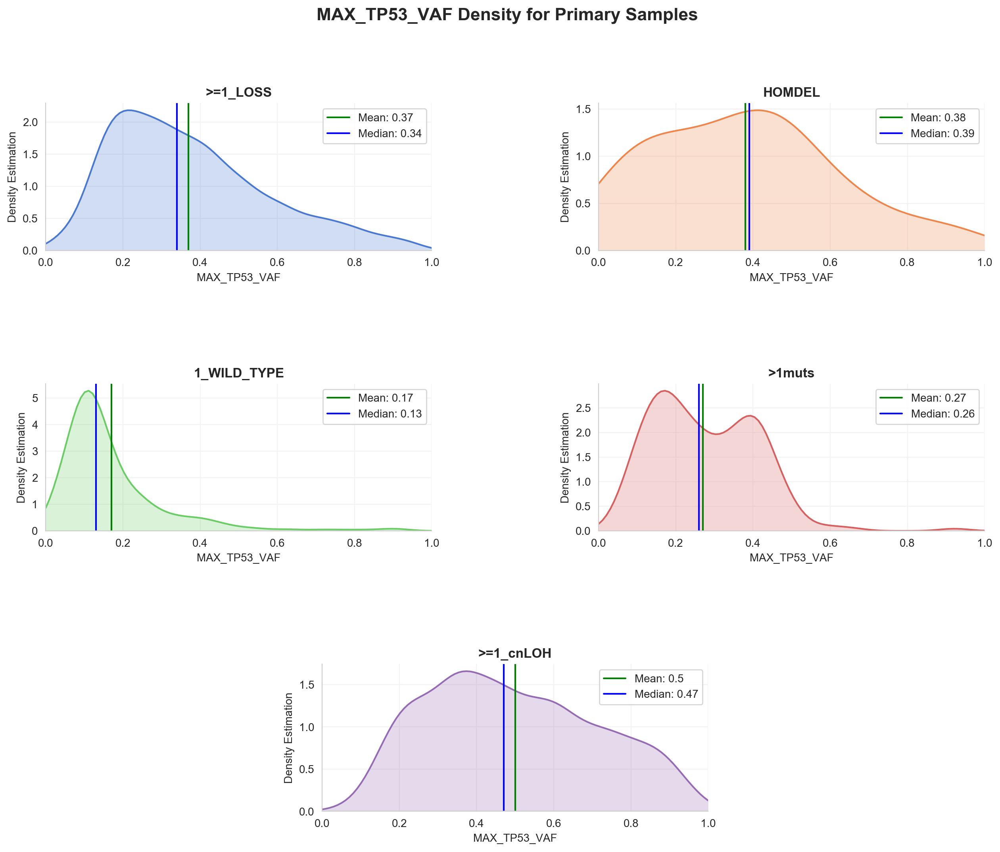

In [150]:
# MAX_VAF Density Comparison for Primary samples
get_densities(max_table_vaf, 'largest', fig_title='MAX_TP53_VAF Density for Primary Samples', xlabel='MAX_TP53_VAF', ylabel='Density Estimation',  number=5, met_prim='Primary')

---
# 1. Scatter Plots

In [53]:
def get_scatters(master:pd.DataFrame, metrics:str, fig_title:str, xlabel, ylabel,  number=6, met_prim:str = None, figsize=(15,12)):
    # We initialize the figure
    fig = def_fig_set(figsize=figsize,number = number)
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(fig_title, fontsize=16, weight='bold')
    
    # We differentiate the groups if we have 
    if number==6: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH', '0_HETLOSS']
    if number==5: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH']
    if number==4: groups = ['>=1_LOSS', 'HOMDEL', '>1muts', '>=1_cnLOH']
        
    for ax, group,i in zip(fig.axes, groups, range(len(groups))):
        if i == 3 : i+=1
        if i == 2 : i+=1
        data = master[master['mut_cn_group'] == group][master['tp53_count'].isin([2,3,4,5])]
        if met_prim:
            data = data[data['Sample_Type'] == met_prim]
        
        data_metrics= data[[metrics+'_1', metrics+'_2',metrics+'_3',metrics+'_4',metrics+'_5']]
        max_table_metrics = pd.DataFrame(np.sort(data_metrics.fillna(0).values)[:,-2:], columns=['2nd-largest','largest'])
        max_table_metrics = pd.concat([max_table_metrics, data.reset_index().cn_state], axis=1)
        sns.scatterplot(x='largest', y='2nd-largest', data=max_table_metrics, ax=ax, color=my_colors[i])
        ax.plot([0,1], [0,1], linewidth=0.5, color='grey')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
            
        ax.set_title(group, weight = 'bold')

### VAF1 / VAF2

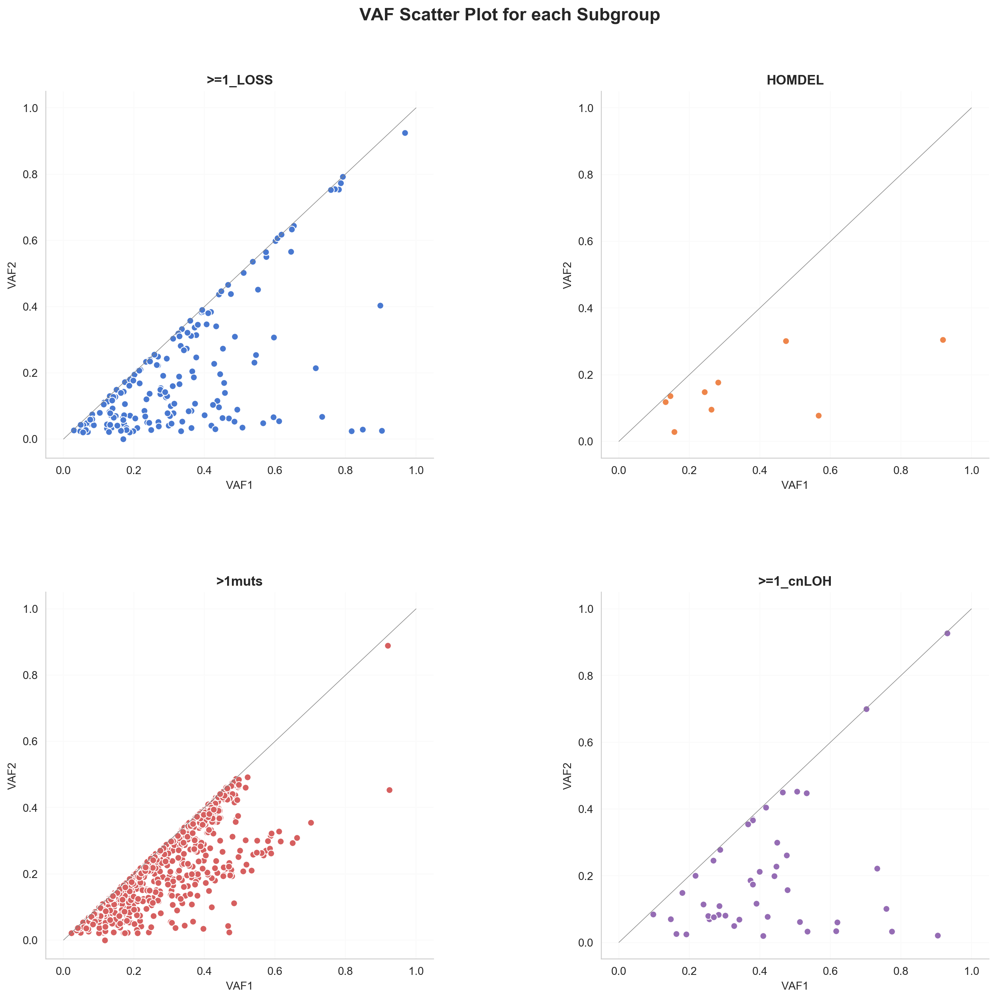

In [54]:
# VAF Plot for all Samples
get_scatters(master, metrics='vaf', fig_title='VAF Scatter Plot for each Subgroup', xlabel='VAF1', ylabel='VAF2',  number=4 ,figsize=(15,20), met_prim = None)

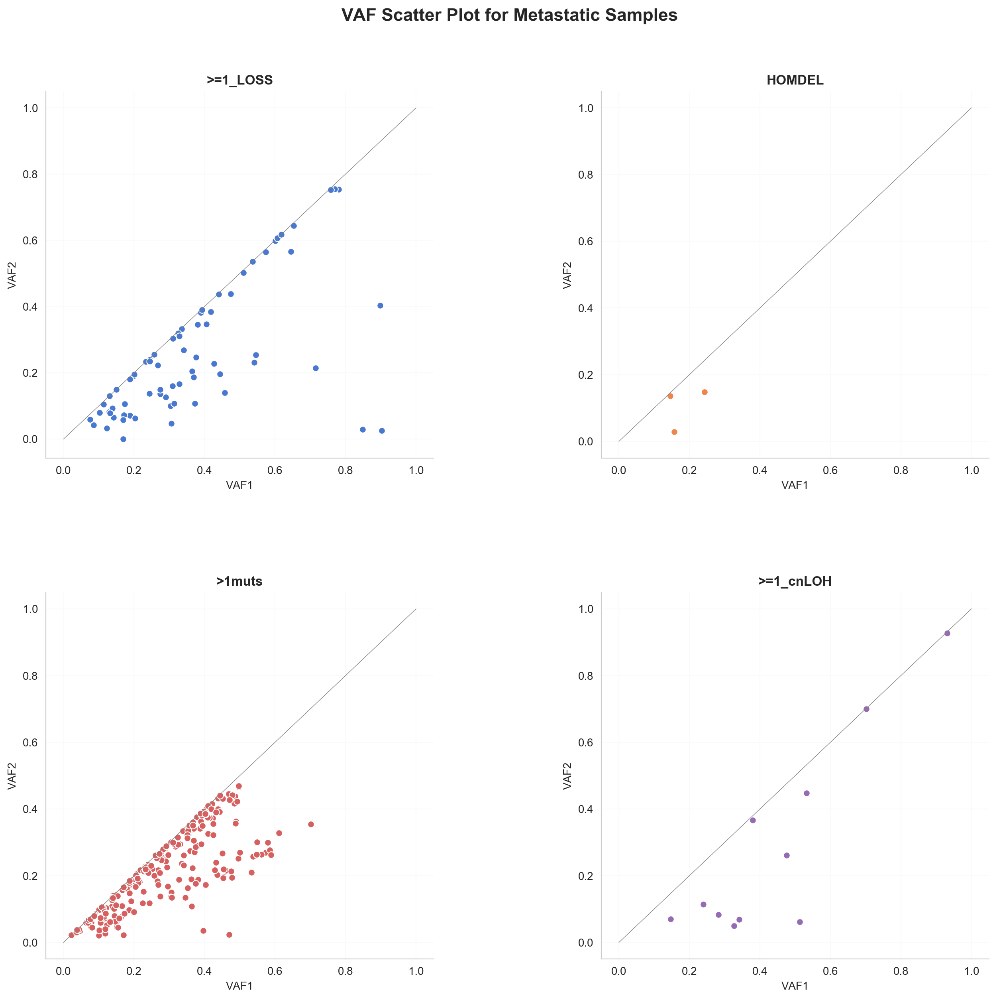

In [191]:
# VAF Plot for Metastatic Samples
get_scatters(master, metrics='vaf', fig_title='VAF Scatter Plot for Metastatic Samples', xlabel='VAF1', ylabel='VAF2',  number=4 ,figsize=(15,20), met_prim = 'Metastasis')

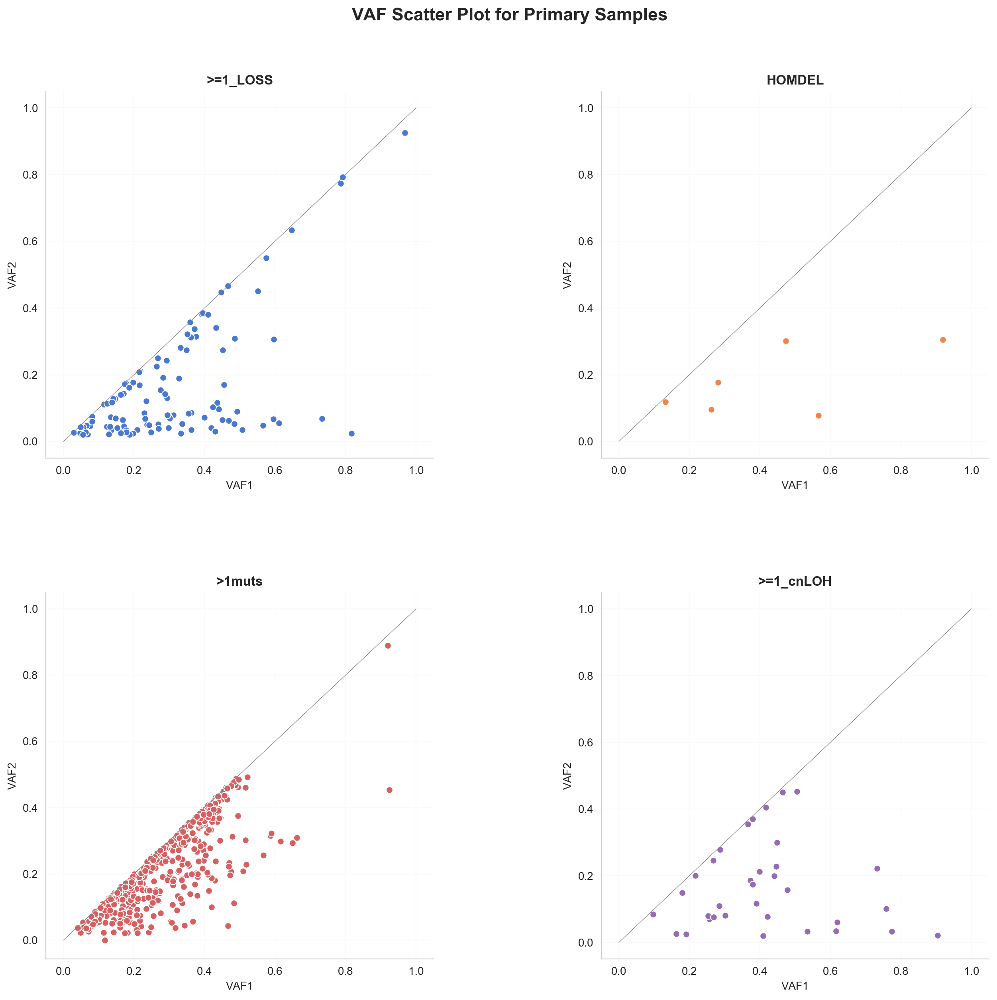

In [192]:
# VAF Plot for Primary Samples
get_scatters(master, metrics='vaf', fig_title='VAF Scatter Plot for Primary Samples', xlabel='VAF1', ylabel='VAF2',  number=4 ,figsize=(15,20), met_prim = 'Primary')

### CCF1 / CCF2

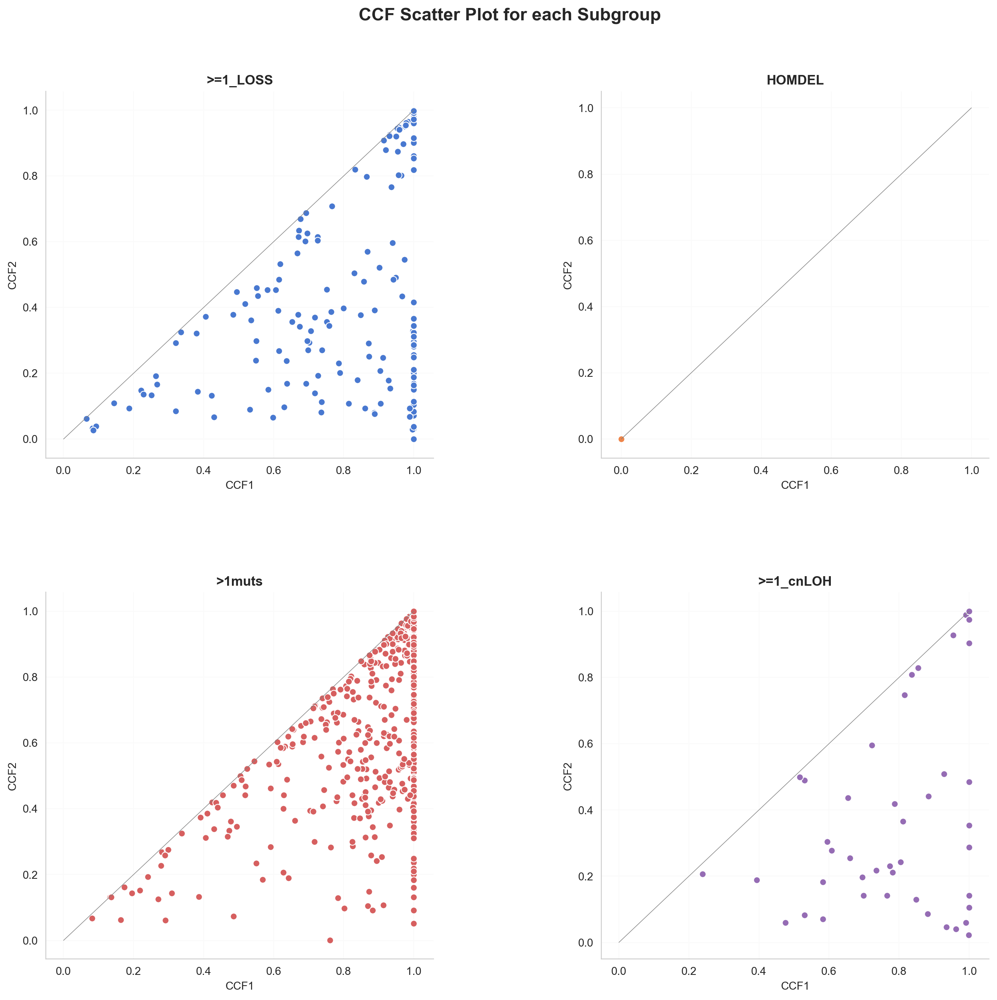

In [193]:
# CCF Plot for all Samples
get_scatters(master, metrics='ccf', fig_title='CCF Scatter Plot for each Subgroup', xlabel='CCF1', ylabel='CCF2',  number=4 ,figsize=(15,20), met_prim = None)

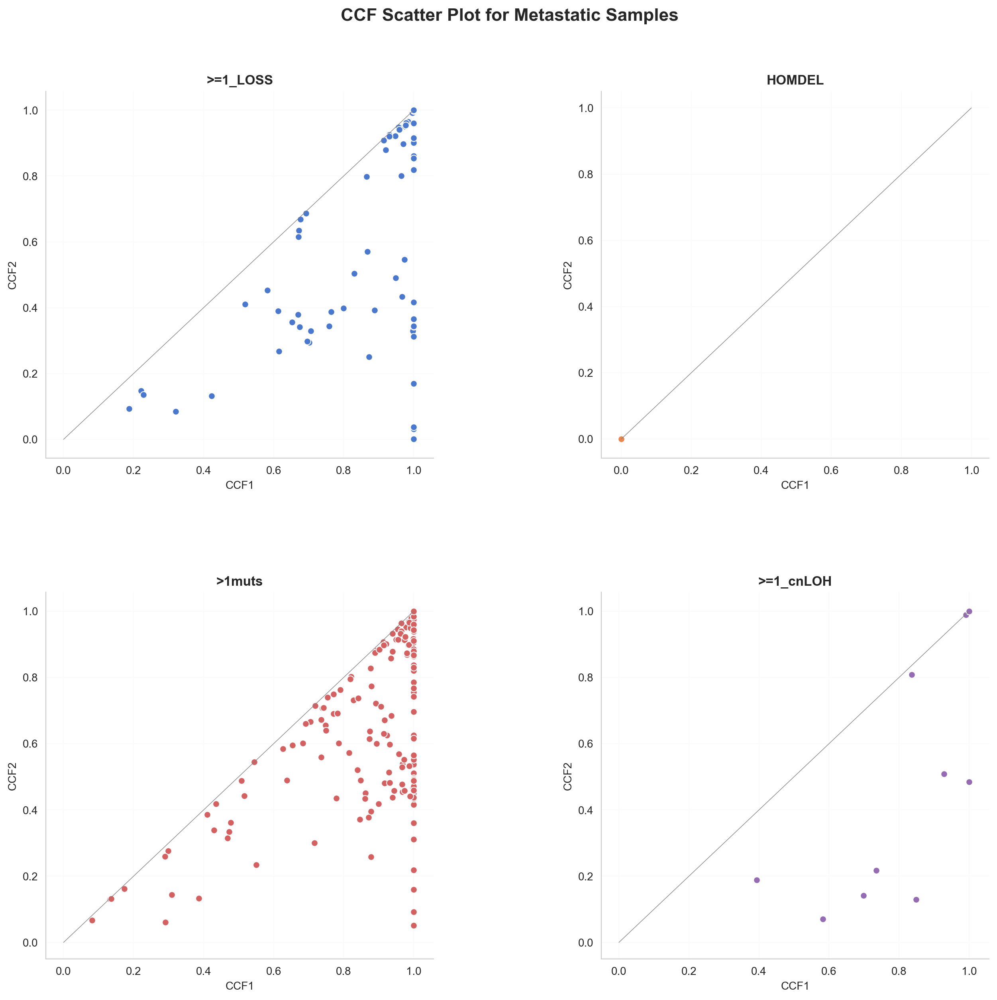

In [194]:
# CCF Plot for Metastatic Samples
get_scatters(master, metrics='ccf', fig_title='CCF Scatter Plot for Metastatic Samples', xlabel='CCF1', ylabel='CCF2',  number=4 ,figsize=(15,20), met_prim = 'Metastasis')

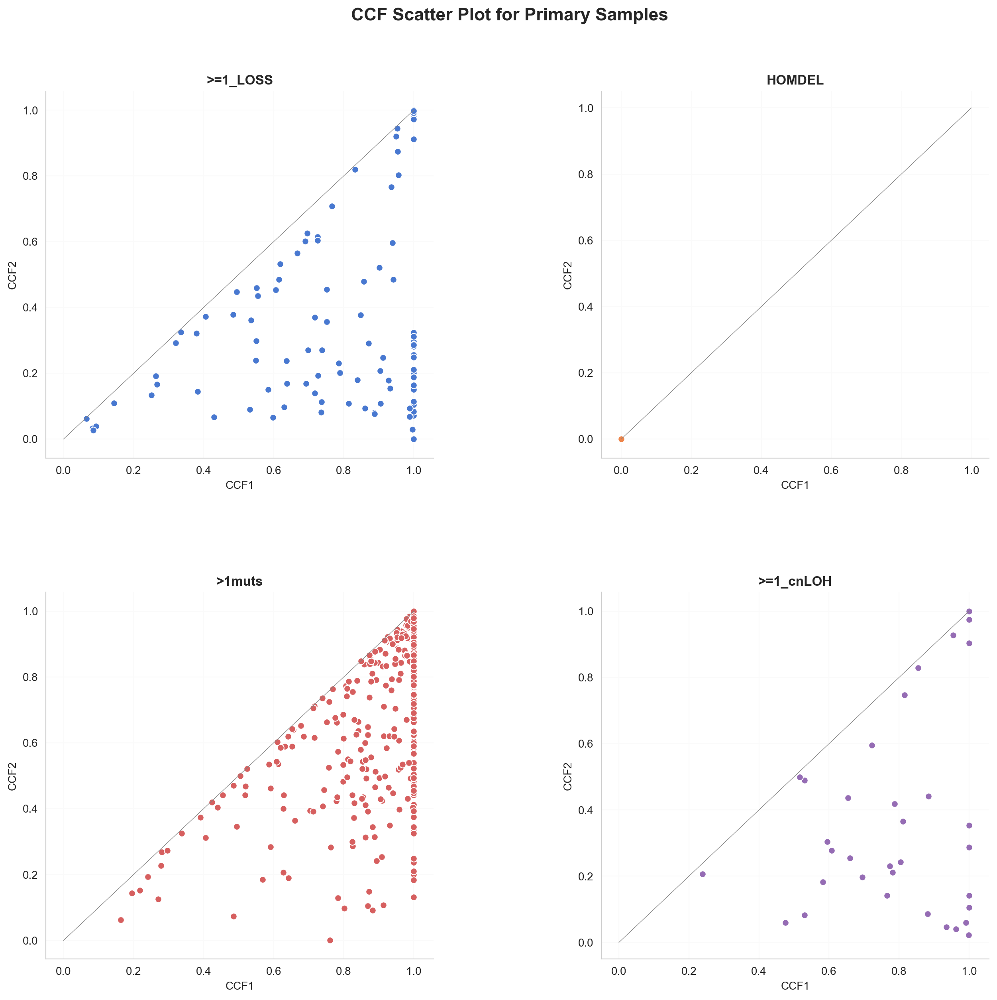

In [195]:
# CCF Plot for Primary Samples
get_scatters(master, metrics='ccf', fig_title='CCF Scatter Plot for Primary Samples', xlabel='CCF1', ylabel='CCF2',  number=4 ,figsize=(15,20), met_prim = 'Primary')

# 4. Survival Analysis

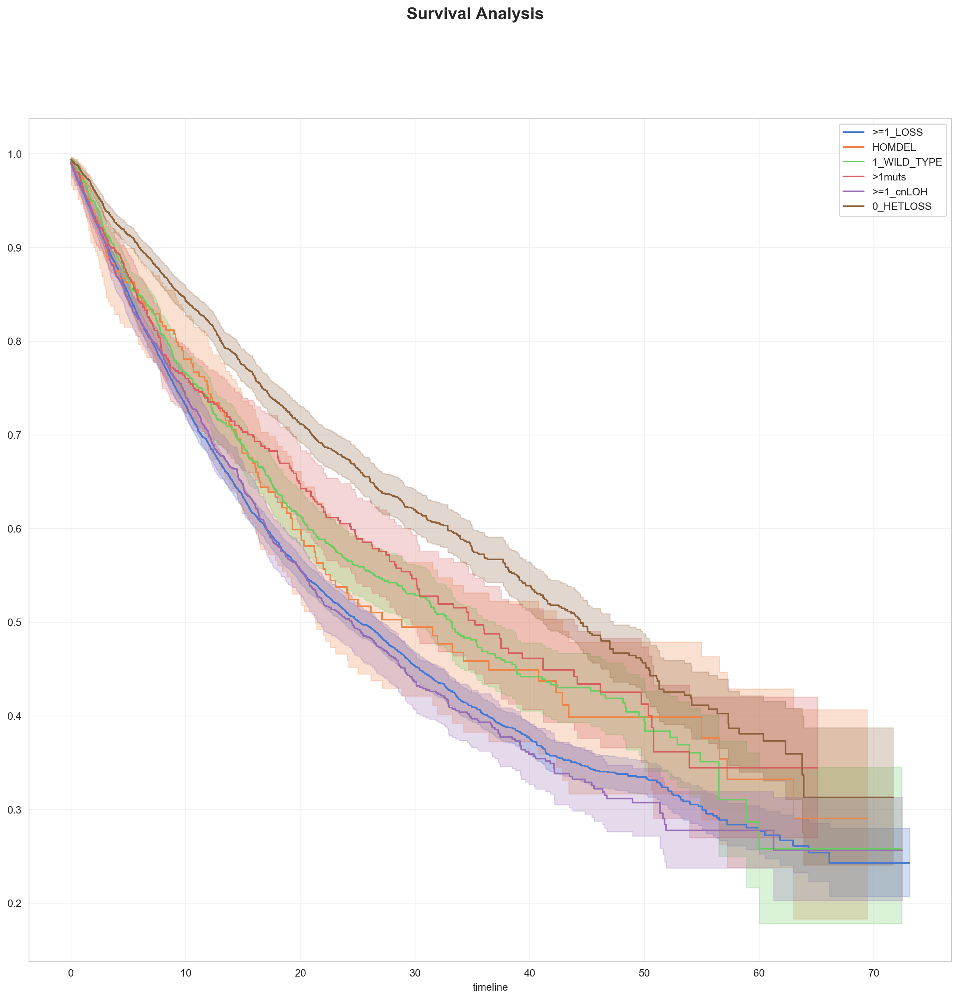

In [224]:
fig = plt.figure(figsize=(16,15))
ax = fig.add_subplot(111)
fig.suptitle('Survival Analysis', fontsize=16, weight='bold')
kmf = KaplanMeierFitter()

for group,i in zip(subgroups, range(len(subgroups))):
    data = master[master['mut_cn_group'] == group].dropna(subset=['Overall Survival (Months)', 'Overall Survival Status'])
    data['Overall Survival Status 0/1'] = data.apply(lambda x: 1 if x['Overall Survival Status'] == 'DECEASED' else 0, axis=1)
    kmf.fit(np.array(data['Overall Survival (Months)']), event_observed=np.array(data['Overall Survival Status 0/1']),  label= group)
    kmf.plot_survival_function(color = my_colors[i], ax=ax)
plt.show()

# 4. MSI and TMB

In [11]:
master_tp53 = master[master['tp53_count'] >= 1]
master.describe()

,purity,ploidy,samples_per_patient,Overall Survival (Months),MSI Score,TMB_Score,ccf_1,vaf_1,ccf_2,vaf_2,ccf_3,vaf_3,ccf_4,vaf_4,ccf_5,vaf_5,tp53_count,tcn,mcn,lcn,seg_length,cf,wgd,mutation_count,gene_count,max_vaf,exp_nb_1,exp_nb_2,exp_nb_3,exp_nb_4,exp_nb_5,chr_affected,chr_loss,chr_gain,chr_cnloh,frac_genome_altered
count,29259.000000,29259.000000,29155.000000,27451.000000,29152.000000,28144.000000,11590.000000,12721.000000,949.000000,1012.000000,109.000000,117.000000,16.000000,21.000000,3.000000,4.000000,29259.000000,28742.000000,26738.000000,26738.000000,2.874200e+04,27513.000000,27167.000000,29259.000000,29259.000000,27838.000000,12719.000000,1012.000000,117.000000,21.000000,4.000000,29259.000000,29259.000000,29259.000000,29259.000000,28750.000000
mean,0.495998,2.474952,1.267570,19.125646,1.302745,7.894994,0.890594,0.386400,0.769462,0.250800,0.680174,0.219702,0.693000,0.223231,0.859667,0.304939,0.474623,1.965312,1.384546,0.522889,4.308968e+07,0.668692,-0.317407,8.903107,7.863256,0.426742,1.624727,1.162460,0.944688,0.987972,1.158984,11.010458,7.490687,3.394033,1.282238,0.503666
std,0.207611,0.675542,0.622895,15.895784,4.652307,17.270019,0.187600,0.228448,0.279210,0.156163,0.339623,0.169474,0.396925,0.144381,0.215119,0.104747,0.583159,0.959469,0.796449,0.552123,2.875875e+07,0.315831,0.948307,19.004200,13.022693,0.220648,0.882606,0.719660,0.745244,0.836355,0.460459,7.394143,6.183536,3.400913,1.843391,0.362783
min,0.018483,-8.573256,1.000000,0.000000,-1.000000,0.000000,0.001000,0.014720,0.001000,0.020277,0.063000,0.021231,0.104000,0.025305,0.612000,0.202840,0.000000,0.000000,0.000000,0.000000,4.679000e+03,0.003341,-1.000000,1.000000,0.000000,0.015625,0.020919,0.035295,0.063314,0.104255,0.808665,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.319343,2.000206,1.000000,6.148000,0.060000,2.600000,0.860000,0.199229,0.600000,0.133260,0.323000,0.084423,0.296750,0.083736,0.789500,0.230733,0.000000,1.000000,1.000000,0.000000,1.846101e+07,0.355764,-1.000000,3.000000,3.000000,0.249461,1.003746,0.785637,0.444652,0.338285,0.927311,5.000000,2.000000,1.000000,0.000000,0.192000
50%,0.469927,2.238190,1.000000,14.630000,0.270000,4.400000,0.983000,0.346939,0.908000,0.226625,0.867000,0.167120,0.978000,0.227652,0.967000,0.290966,0.000000,2.000000,1.000000,0.000000,3.331897e+07,0.685332,-1.000000,5.000000,5.000000,0.394158,1.513791,1.020188,0.897589,0.969455,0.995645,9.000000,6.000000,2.000000,1.000000,0.372000
75%,0.658602,2.881544,1.000000,28.899000,0.860000,7.000000,1.000000,0.540135,1.000000,0.358847,1.000000,0.335740,1.000000,0.347611,0.983500,0.365173,1.000000,2.000000,2.000000,1.000000,8.066841e+07,1.000000,1.000000,8.000000,8.000000,0.578113,2.045622,1.384709,1.131352,1.041447,1.227318,20.000000,12.000000,5.000000,2.000000,0.982000
max,0.989434,6.927210,10.000000,73.118000,53.850000,501.200000,1.000000,0.992523,1.000000,0.967922,1.000000,0.930791,1.000000,0.444020,1.000000,0.434985,5.000000,76.000000,71.000000,5.000000,8.110875e+07,1.000000,1.000000,571.000000,266.000000,1.017857,19.178010,7.775482,5.074002,3.304726,1.835982,22.000000,27.000000,22.000000,19.000000,1.000000


In [93]:
def get_simple_scatters(master:pd.DataFrame,x,y, fig_title:str, xlabel, ylabel,  number=6, met_prim:str = None, figsize=(15,12), xlim = [0,100], ylim=[-2,10]):
    # We initialize the figure
    fig = def_fig_set(figsize=figsize,number = number)
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(fig_title, fontsize=16, weight='bold')
    
    # We differentiate the groups if we have 
    if number==6: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH', '0_HETLOSS']
    if number==5: groups = ['>=1_LOSS', 'HOMDEL', '1_WILD_TYPE', '>1muts', '>=1_cnLOH']
    if number==4: groups = ['>=1_LOSS', 'HOMDEL', '>1muts', '>=1_cnLOH']
        
    for ax, group,i in zip(fig.axes, groups, range(len(groups))):
        data = master[master['mut_cn_group'] == group]
        if met_prim:
            data = data[data['Sample_Type'] == met_prim]
    
        sns.scatterplot(x=x, y=y, data=data, ax=ax, color=my_colors[i])
        ax.plot([0,1], [0,1], linewidth=0.5, color='grey')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_ylim(ylim)
        ax.set_xlim(xlim)
            
        ax.set_title(group, weight = 'bold')

### MSI Score

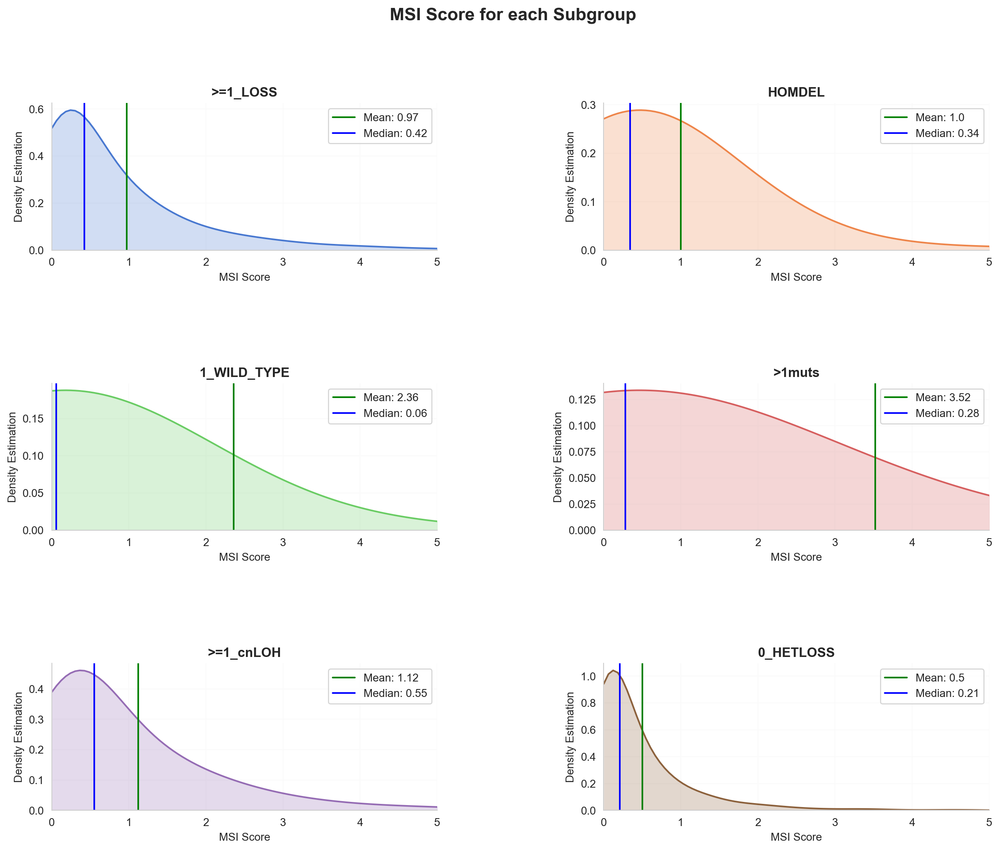

In [51]:
# Purity Comparison for all samples
get_densities(master, 'MSI Score', fig_title='MSI Score for each Subgroup', xlabel='MSI Score', ylabel='Density Estimation',  number=6, clip =(0,6), x_lim = [0.0,5.0])

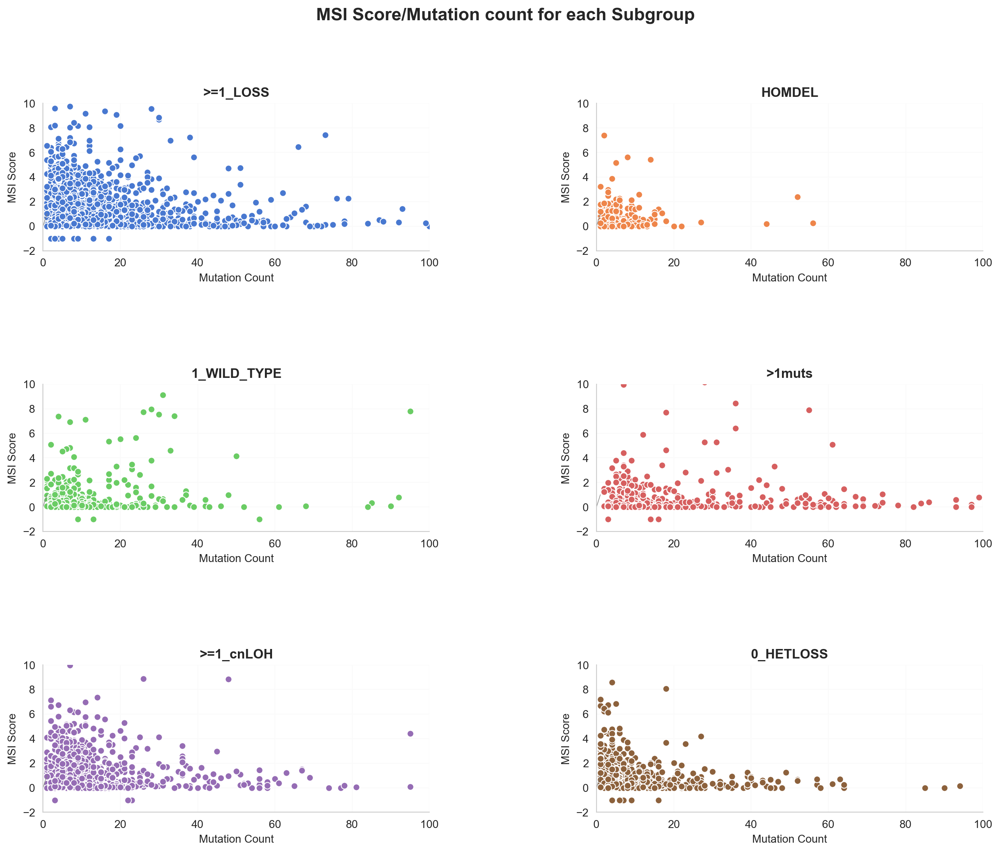

In [87]:
get_simple_scatters(master,y='MSI Score', x='mutation_count', fig_title='MSI Score/Mutation count for each Subgroup', 
                    xlabel='Mutation Count', ylabel='MSI Score',  number=6,figsize=(15,12), xlim = [0,100], ylim=[-2,10])

### TMB

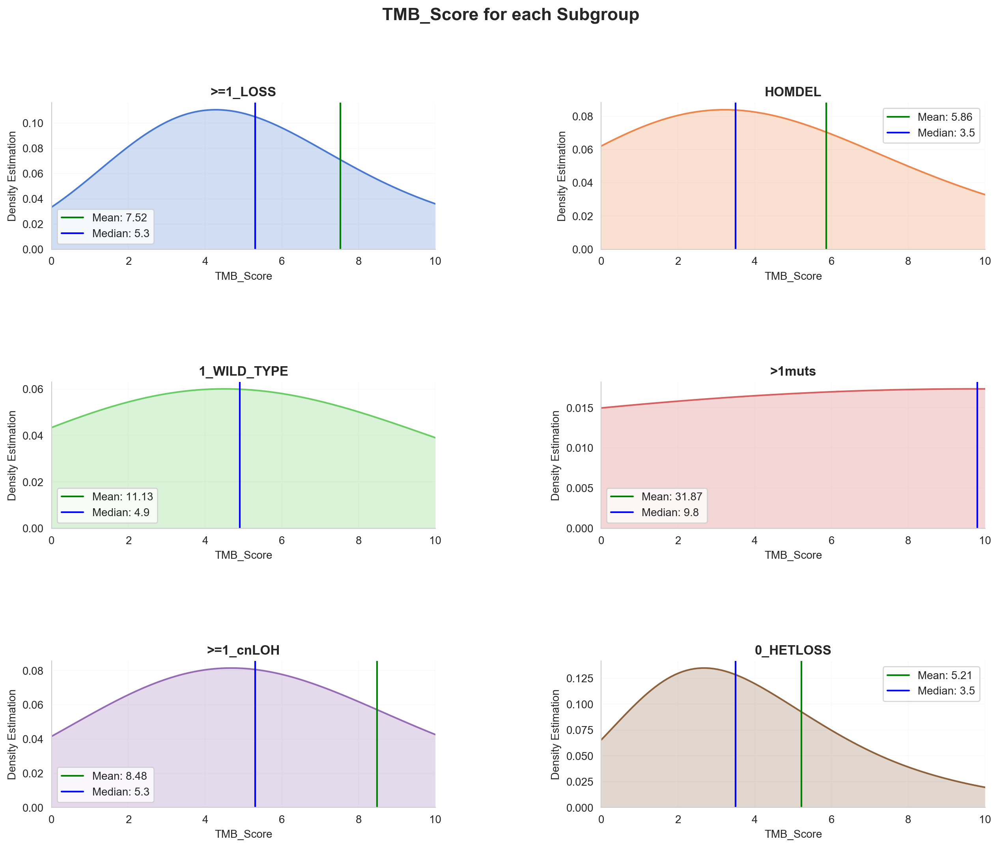

In [89]:
# Purity Comparison for all samples
get_densities(master, 'TMB_Score', fig_title='TMB_Score for each Subgroup', xlabel='TMB_Score', ylabel='Density Estimation',  number=6, clip =(0,10), x_lim = [0.0,10.0])

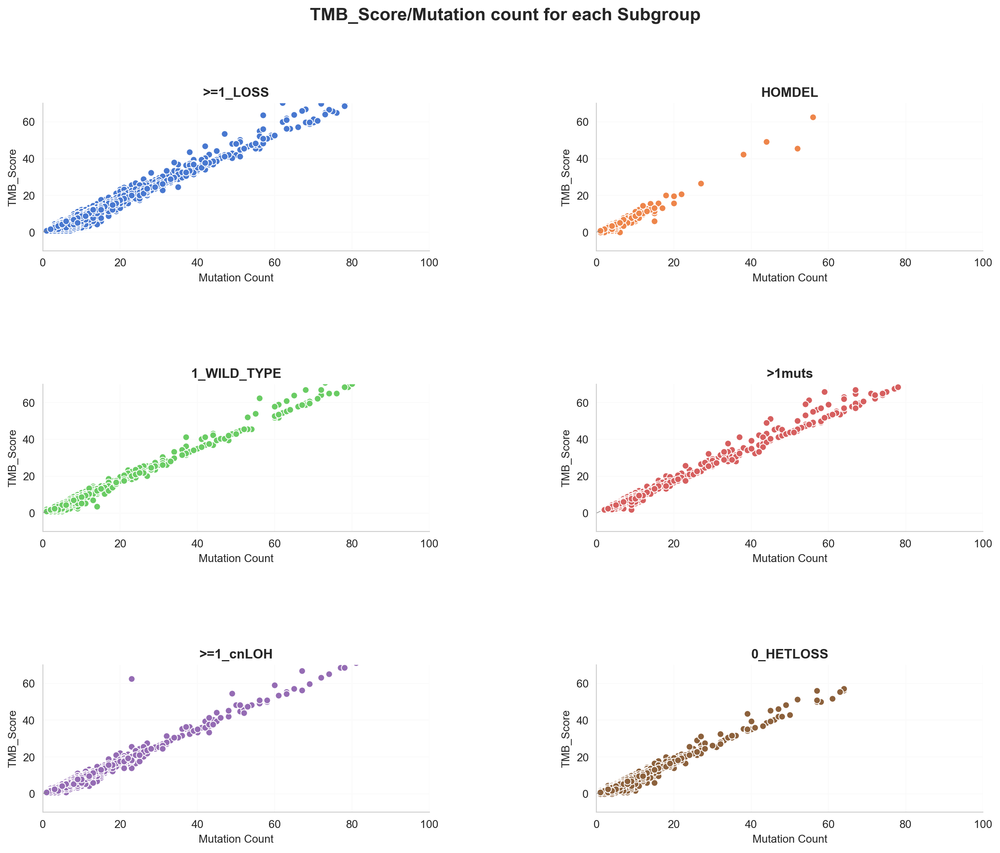

In [98]:
get_simple_scatters(master,y='TMB_Score', x='mutation_count', fig_title='TMB_Score/Mutation count for each Subgroup', 
                    xlabel='Mutation Count', ylabel='TMB_Score',  number=6,figsize=(15,12), xlim = [0,100], ylim=[-10,70])